# 2023 WRF-Python Tutorial #

## Autor : Andres Figueroa Curo ##

## NCAR/CISL/VAST ##

## Fuente:  Michaela Sizemore ##


## Topicos ##
 - Descripción general
 - Empezando 
 - Uso de funciones WRF-Python
 - Trazado con WRF-Python usando Cartopy y Matplotlib


## Que es WRF-Python? ##

 - WRF-Python es una herramienta de post-procesamiento similar al paquete WRF de NCL
     - Contiene más de 30 rutinas de diagnóstico (CAPE, storm relative helicity, cloud top temperature, etc)
     - Rutinas de interpolación (level, cross section, surface)
     - Utilidades para ayudar con el trazado a través de cartopy, basemap, PyNGL
 - solo WRF-ARW
 - WRF-Python **NO** es una herramienta para correr el modelo WRF-ARW con python
 
## Donde puedo encontrar ayuda con WRF-Python? ##
 - [GitHub Repository](https://github.com/NCAR/wrf-python) 
     - WRF-Python es de código abierto, y alentamos enfáticamente la opinión pública con su proceso de desarrollo
     - Buen sitio para explorar si encuentra errores en el código, tiene alguna funcionalidad que desea ver o para hacer y responder preguntas de la comunidad
 - [WRF-Python Talk](https://groups.google.com/a/ucar.edu/g/wrfpython-talk) Google Group 
     - Un poco más para problemas de código, soporte al usuario y preguntas generales
 - [WRF-Python ReadTheDocs](https://wrf-python.readthedocs.io/en/latest/) page
     - Contiene todas las API, guías de instalación, tabla de diagnósticos disponibles, preguntas frecuentes y ejemplos de trazado 

## ¿Qué sucedió con el paquete WRF de NCL? ¿Por qué está esto en Python? ##

NCAR ha tomado la decisión de "pasar a Python" como la plataforma de lenguaje de secuencias de comandos preferida para el desarrollo futuro de herramientas de análisis y visualización. Actualmente, el software de NCL se encuentra en "modo de mantenimiento", lo que significa que no se agregarán nuevas funciones ni se abordarán los defectos de software no críticos. Dicho esto, el equipo de GeoCAT se dedica a proporcionar tutoriales y materiales de ejemplo para ayudar a los usuarios de NCL en la transición de NCL a Python.

# Empezando #

Para comenzar, primero leeremos los paquetes necesarios que usaremos hoy. Asegúrese de no obtener errores de este proceso. Si tiene algún error, intente lo siguiente para solucionarlo:
- Asegúrese de que el entorno conda esté activado para el tutorial.
     - Debería ver el entorno conda en el extremo izquierdo de la línea de comando que está utilizando
     - Si no es correcto, ejecute ***conda deactivate*** y luego ***conda activate ENV NAME***
- Asegúrese de que el entorno contenga todos los paquetes necesarios
     - Si recibe un error que dice que no se encuentra un paquete, en la línea de comando (con el entorno activado) ejecute ***conda list*** y asegúrese de que el paquete que le da el error esté instalado
- Asegúrese de que sus paquetes tengan la versión correcta ***IMPORTANTE***
     - Esto también se puede ver a través de ***conda list*** en el lado derecho de la impresión
     - Las versiones de los paquetes que se utilizarán hoy serán:
     
**NotA:** si su Jupyter Notebook falla en algún momento, asegúrese de volver a ejecutar la siguiente celda de código antes que cualquier otra

librerias: xarray, cartopy, basemap, pyproj, wrf-library, metpy, shapely

In [2]:
#librerias para manejar recursos geo y cartograficos
import pyproj
import cartopy
import numpy as np
import pandas as np
import shapely
from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import matplotlib.artist
import metpy
import os

In [88]:
WRF_DIRECTORY = "C:/Users/andre/Documents/trabajos/WRF_SELVA/DATOS_WRF/PERU/ENERO/20230101"
#Verificar los datos 
os.listdir(WRF_DIRECTORY)

['wrfout_d01_2023-01-01_00_00_00',
 'wrfout_d01_2023-01-01_06_00_00',
 'wrfout_d01_2023-01-01_12_00_00',
 'wrfout_d01_2023-01-01_18_00_00',
 'wrfout_d01_2023-01-02_00_00_00',
 'wrfout_d01_2023-01-02_06_00_00',
 'wrfout_d01_2023-01-02_12_00_00',
 'wrfout_d01_2023-01-02_18_00_00',
 'wrfout_d01_2023-01-03_00_00_00',
 'wrfout_d01_2023-01-03_06_00_00',
 'wrfout_d01_2023-01-03_12_00_00',
 'wrfout_d01_2023-01-03_18_00_00',
 'wrfout_d01_2023-01-04_00_00_00',
 'wrfout_d01_2023-01-04_06_00_00',
 'wrfout_d01_2023-01-04_12_00_00',
 'wrfout_d01_2023-01-04_18_00_00',
 'wrfout_d01_2023-01-05_00_00_00',
 'wrfout_d01_2023-01-05_06_00_00',
 'wrfout_d01_2023-01-05_12_00_00',
 'wrfout_d01_2023-01-05_18_00_00',
 'wrfout_d01_2023-01-06_00_00_00',
 'wrfout_d01_2023-01-06_06_00_00',
 'wrfout_d01_2023-01-06_12_00_00',
 'wrfout_d01_2023-01-06_18_00_00',
 'wrfout_d01_2023-01-07_00_00_00']

In [89]:
from __future__ import print_function

# This jupyter notebook command inserts matplotlib graphics in 
# to the workbook
%matplotlib inline

# Modificar la ruta a donde se encuentran los datos, descargue los archivos aparte
#y los puse en la carpeta porque al clonar no descarga los files
WRF_DIRECTORY = "C:/Users/andre/Documents/trabajos/WRF_SELVA/DATOS_WRF/PERU/ENERO/20230101"
WRF_FILES = ['wrfout_d01_2023-01-01_00_00_00',
             'wrfout_d01_2023-01-01_06_00_00',
             'wrfout_d01_2023-01-01_12_00_00', 
             'wrfout_d01_2023-01-01_18_00_00', 
             'wrfout_d01_2023-01-02_00_00_00',
             'wrfout_d01_2023-01-02_06_00_00',
             'wrfout_d01_2023-01-02_12_00_00',
             'wrfout_d01_2023-01-02_18_00_00',
             'wrfout_d01_2023-01-03_00_00_00',
             'wrfout_d01_2023-01-03_06_00_00',
             'wrfout_d01_2023-01-03_12_00_00',
             'wrfout_d01_2023-01-03_18_00_00',
             'wrfout_d01_2023-01-04_00_00_00', 
             'wrfout_d01_2023-01-04_06_00_00',
             'wrfout_d01_2023-01-04_12_00_00', 
             'wrfout_d01_2023-01-04_18_00_00',
             'wrfout_d01_2023-01-05_00_00_00',
             'wrfout_d01_2023-01-05_06_00_00', 
             'wrfout_d01_2023-01-05_12_00_00',
             'wrfout_d01_2023-01-05_18_00_00',
             'wrfout_d01_2023-01-06_00_00_00',
             'wrfout_d01_2023-01-06_06_00_00',
             'wrfout_d01_2023-01-06_12_00_00',
             'wrfout_d01_2023-01-06_18_00_00', 
             'wrfout_d01_2023-01-07_00_00_00']

# No modificar el codigo desde aqui para abajo
#------------------------------------------------------
# apagar los warnings
import warnings
warnings.filterwarnings('ignore')

# Asegurar que el environment esta bien
#en la base tuve que entrar como administrador y conda install cartopy y lo que hacia falta
#instale tbm desde la base WRF con: https://wrf-python.readthedocs.io/en/latest/installation.html
#que seria: conda install -c conda-forge wrf-python
import numpy as np
import cartopy
from cartopy import crs
from cartopy.feature import NaturalEarthFeature
import matplotlib
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from xarray import DataArray
import os

from wrf import (getvar, interplevel, vertcross, 
                 vinterp, CoordPair, ALL_TIMES, to_np,
                 xy_to_ll, ll_to_xy, get_cartopy, latlon_coords,
                 cartopy_xlim, cartopy_ylim)

_WRF_FILES = [os.path.abspath(os.path.expanduser(
    os.path.join(WRF_DIRECTORY, f))) for f in WRF_FILES]

# Revisa si existe los archivos 
for f in _WRF_FILES:
    if not os.path.exists(f):
        raise ValueError("{} does not exist. "
            "Check for typos or incorrect directory.")

# Create functions so that the WRF files only need
# to be specified using the WRF_FILES global above

def single_wrf_file():
    global _WRF_FILES
    return _WRF_FILES[0]

def multiple_wrf_files():
    global _WRF_FILES
    return _WRF_FILES

print("Todo bien hecho!")


Todo bien hecho!


## Leyendo archivos wrfout y echando un vistazo a los datos que contienen ##
Ahora que todas las pruebas han pasado, intentemos leer un solo archivo wrfout con netcdf4 y ver qué datos contiene.

La variable 'wrfin' de ahora en adelante se usará para todos los ejemplos de una sola variable

In [90]:
file_path = single_wrf_file() # Necesario debido a que single_wrf_file es una función

wrfin = Dataset(file_path) #wrf tiene todo el dataset - osea singular 
print(wrfin)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    TITLE:  OUTPUT FROM WRF V4.2 MODEL
    START_DATE: 2023-01-01_00:00:00
    SIMULATION_START_DATE: 2023-01-01_00:00:00
    WEST-EAST_GRID_DIMENSION: 333
    SOUTH-NORTH_GRID_DIMENSION: 360
    BOTTOM-TOP_GRID_DIMENSION: 35
    DX: 6000.0
    DY: 6000.0
    AERCU_OPT: 0
    AERCU_FCT: 1.0
    IDEAL_CASE: 0
    DIFF_6TH_SLOPEOPT: 0
    AUTO_LEVELS_OPT: 2
    DIFF_6TH_THRESH: 0.1
    DZBOT: 50.0
    DZSTRETCH_S: 1.3
    DZSTRETCH_U: 1.1
    SKEBS_ON: 0
    SPEC_BDY_FINAL_MU: 1
    USE_Q_DIABATIC: 0
    GRIDTYPE: C
    DIFF_OPT: 1
    KM_OPT: 4
    DAMP_OPT: 3
    DAMPCOEF: 0.2
    KHDIF: 0.0
    KVDIF: 0.0
    MP_PHYSICS: 6
    RA_LW_PHYSICS: 4
    RA_SW_PHYSICS: 4
    SF_SFCLAY_PHYSICS: 91
    SF_SURFACE_PHYSICS: 2
    BL_PBL_PHYSICS: 1
    CU_PHYSICS: 16
    SF_LAKE_PHYSICS: 0
    SURFACE_INPUT_SOURCE: 3
    SST_UPDATE: 0
    GRID_FDDA: 0
    GFDDA_INTERVAL_M: 0
    GFDDA_END_H: 0
    GRID_SFDDA: 0


In [91]:
# Try extracting 'V' variable
#Tratando de extraer la variable "V" 
var = wrfin.variables['V']
print(var)
# Other options of things you can look at:
#Otras opciones que tu puedes revisar:
# 'XLAT' 'XLAT' 

#current shape es a los 4 niveles

#current shape = (1, 34, 360, 332) el 1 explica que es a un nivel de tiempo, 
#el 34 explica los niveles verticales, el 360 y 332 son el xlat y xlon

<class 'netCDF4._netCDF4.Variable'>
float32 V(Time, bottom_top, south_north_stag, west_east)
    FieldType: 104
    MemoryOrder: XYZ
    description: y-wind component
    units: m s-1
    stagger: Y
    coordinates: XLONG_V XLAT_V XTIME
unlimited dimensions: Time
current shape = (1, 34, 360, 332)
filling on, default _FillValue of 9.969209968386869e+36 used


In [92]:
# Lets look at a specific attribute, 'coordinates', of that variable
#Veamos un atributo específico, 'coordenadas', de la variable
coords = var.coordinates
print(coords)

XLONG_V XLAT_V XTIME


In [93]:
# To see all data presented in a numpy array try:
#Para ver toda la data presente en numpy array tratar esto:
var_all_dat = var[:]
print(var_all_dat)

[[[[ 5.527163    5.526108    5.5007544  ... -1.4822179  -1.4702358
    -1.2010176 ]
   [ 5.6287045   5.623937    5.5955358  ... -1.6016332  -1.4772904
    -1.2225363 ]
   [ 5.685317    5.6784697   5.6512523  ... -1.5443845  -1.3282818
    -1.2197566 ]
   ...
   [ 6.303309    6.342105    6.3876     ... -0.27428547 -0.28475845
    -0.49337646]
   [ 6.282041    6.309824    6.3452578  ... -0.29395622 -0.14231782
    -0.71319723]
   [ 6.260947    6.279598    6.30684    ... -0.3267084  -0.17073399
    -0.520544  ]]

  [[ 5.8162      5.8076944   5.769559   ... -1.4436395  -1.4458896
    -1.2553997 ]
   [ 5.9166346   5.9035764   5.861518   ... -1.5709338  -1.526545
    -1.2269484 ]
   [ 5.970607    5.956118    5.916692   ... -1.5898099  -1.3352033
    -1.2207228 ]
   ...
   [ 6.573188    6.611971    6.657932   ... -0.36323145 -0.43978676
    -0.7112669 ]
   [ 6.548732    6.578909    6.617742   ... -0.29478335 -0.13769959
    -0.95659864]
   [ 6.526099    6.5483856   6.580942   ... -0.32864767 

In [150]:
# To select for a specific time index, sale 0 porque solo es un time index. 
#Para seleccionar un tiempo indice especifico
t0_data = var[1:]
print(t0_data)

#PUEDES UTILIZAR OTRO ARCHIVO .nc que contenga (#, z,x,y) un numero mayor a 1, en este caso saldra [] ya que es solo un timeindex


[]


In [149]:
#puedes usar getvar para cargar variables de un archivo de salida del modelo WRF y
#asignarlas a variables Python para su posterior análisis y visualización. 
t0 = getvar(wrfin, 'slp', timeidx=ALL_TIMES, )
t0_sub = t0[0:2]
print(t0_sub)

<xarray.DataArray 'slp' (south_north: 2, west_east: 332)>
array([[1017.50195, 1017.49384, 1017.4904 , 1017.49005, 1017.49115,
        1017.4924 , 1017.4977 , 1017.50336, 1017.5077 , 1017.50726,
        1017.5005 , 1017.48987, 1017.4782 , 1017.46814, 1017.4613 ,
        1017.4589 , 1017.4574 , 1017.4537 , 1017.4439 , 1017.42535,
        1017.39966, 1017.3721 , 1017.34576, 1017.3255 , 1017.30963,
        1017.29626, 1017.2856 , 1017.2785 , 1017.27527, 1017.27704,
        1017.28094, 1017.28595, 1017.29   , 1017.29474, 1017.2999 ,
        1017.3048 , 1017.30865, 1017.31036, 1017.31024, 1017.3087 ,
        1017.30774, 1017.30743, 1017.3094 , 1017.3119 , 1017.31415,
        1017.3155 , 1017.3135 , 1017.31104, 1017.3069 , 1017.30035,
        1017.2902 , 1017.27496, 1017.2545 , 1017.23224, 1017.2125 ,
        1017.1995 , 1017.1934 , 1017.19104, 1017.1895 , 1017.18567,
        1017.17773, 1017.16766, 1017.1558 , 1017.14386, 1017.1317 ,
        1017.1172 , 1017.10175, 1017.08746, 1017.07935, 10

## Una barra lateral rápida sobre subconjuntos de archivos wrfout ##


Puede encontrar que su archivo wrfout es demasiado grande para lo que necesitas (como enviarlo por correo electrónico o cargarlo en GitHub). Para resolver esto, es posible que desee crear un subconjunto de los datos del archivo solo para las variables de datos necesarias para su proyecto. Esto le permitirá reducir el tamaño del archivo a una versión más básica del archivo original, lo que también reducirá el tamaño del archivo. Aquí es cuando usar xarray puede ser una buena idea.

### OPCIONAL: ¿Dónde puedo averiguar qué variables son necesarias para una variable WRF-Python? ###

Generally, the variables defined below are enough, but sometimes an extra variable is necessary to perform the function. The [source code](https://github.com/NCAR/wrf-python/blob/develop/src/wrf/routines.py) of 'getvar' is the best place to start finding the variables used. You can usually track the variables through your IDE of choice by command-clicking them, but if that isn't working, the GitHub repository contains the full source code for wrf-python. The quick guide on this step is as follows:
 
Generalmente, las variables definidas a continuación son suficientes, pero a veces es necesaria una variable adicional para realizar la función. El [source code](https://github.com/NCAR/wrf-python/blob/develop/src/wrf/routines.py) de 'getvar' es el mejor lugar para comenzar a encontrar las variables utilizadas. Por lo general, puede realizar un seguimiento de las variables a través de su IDE de elección haciendo clic en ellas, pero si eso no funciona, el repositorio de GitHub contiene el código fuente completo para wrf-python. La guía rápida de este paso es la siguiente:
 
 
 1. Abra el código fuente en GitHub para la función *getvar*. Este es el archivo 'rutinas.py'.
 
 
 2. A partir de la línea 38, hay una lista llamada _FUNC_MAP que realmente le dice a getvar dónde buscar las rutinas correctas para procesar los datos necesarios para la variable solicitada.
 
 
 3. Para este ejemplo, quiero 'height_agl'. Así que me desplazaré hasta height_agl en la línea 82 y veré que usa la función 'get_height_agl'
 
 
 4. Luego me desplazaré hasta la parte superior y veré que 'get_height_agl' está en el archivo 'g_geoht'
 
 
 5. Sabiendo esto, regresaré al directorio src/wrf e iré al archivo g_geoht.py
 
 
 6. A continuación, mire la función _get_geoht que comienza en la línea 12. Esta es la función contenedora "interna", lo que significa que hace la mayor parte del trabajo pesado del contenedor "externo", con el que nosotros, como usuarios, interactuamos.. 
 
 
 7. Al observar lo interno, veo que necesita la variable "PH" con "PHB" y "HGT" (línea 87) o la variable "GMT" con la variable "HGT_M" (línea 99).
 
 
 8. Entonces, si estuviera subdividiendo mi conjunto de datos con el código a continuación, me gustaría asegurarme de que las variables de la línea 87 o 99 se incluyeron en 'toinclude'.
 
 
 9. Luego ejecutaría este código con mi archivo wrfout y lo probaría en mi código de Python para asegurarme de que se incluyeron todas las variables de datos necesarias. Si falta alguna variable, recibirá un mensaje de error que le indicará qué variable falta, momento en el que solo tendrá que actualizar la sección "toinclude" y volver a ejecutar el código de subconjunto.

In [96]:
import xarray as xr
# Open data file using xarray 
# Abrir los archivos usando xarray 
ds = xr.open_dataset(file_path, decode_times=False)
print(ds)

<xarray.Dataset>
Dimensions:                (Time: 1, south_north: 359, west_east: 332,
                            bottom_top: 34, bottom_top_stag: 35,
                            soil_layers_stag: 4, west_east_stag: 333,
                            south_north_stag: 360, seed_dim_stag: 33)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 ...
    XLONG                  (Time, south_north, west_east) float32 ...
    XTIME                  (Time) float32 ...
    XLAT_U                 (Time, south_north, west_east_stag) float32 ...
    XLONG_U                (Time, south_north, west_east_stag) float32 ...
    XLAT_V                 (Time, south_north_stag, west_east) float32 ...
    XLONG_V                (Time, south_north_stag, west_east) float32 ...
Dimensions without coordinates: Time, south_north, west_east, bottom_top,
                                bottom_top_stag, soil_layers_stag,
                                west_east_stag, south_north_stag, s

In [98]:
# This defines the file name, you can change this to be whatever you like as long as it is in quotes
# Esto define el nombre del archivo, puede cambiarlo para que sea lo que quiera siempre que esté entre comillas

new_file = "single_wrf_file_subset.nc"
new_file

'single_wrf_file_subset.nc'

In [99]:
# This represents the data variables that you want to extract. 
# Esto representa las variables de datos que desea extraer.

# These are the minimum variables needed for most wrf functions
# Estas son las variables mínimas necesarias para la mayoría de las funciones wrf
toinclude = ['HGT', 'QVAPOR', 'QRAIN', 'QCLOUD', 'P', 'PB', 'PHB', 'PH', 'T', 'U', 'V','RAINNC', 'OLR','LH','HFX']


In [147]:
#Para exportarlo (en este caso el ds) con las variables y nombre provisionado

ruta_archivo = 'C:/Users/andre/Downloads/wrf_archivo_nuevito.nc' # puedes modificar este enlace
ds[toinclude].to_netcdf(ruta_archivo)
#CON ESO SE GUARDA EL ARCHIVO AUTOMATICAMENTE

# Usando funciones de WRF-Python #

Ahora usaremos la función 'getvar' para procesar los datos del archivo wrfout y devolver una variable específica. Esta variable se puede utilizar más adelante en el trazado con Cartopy.

cuando timeidx=ALL_TIMES, la forma es diferente, ¿por qué? 4 índices de tiempo, agregando la "cuarta dimensión" a los datos cuando se ejecutan. Cuando seleccionamos un índice de tiempo específico, esta dimensión adicional desaparece.

when timeidx=ALL_TIMES, shape is different, why? 4 (cambiar este numero!) time indexes,adding the "4th dimension" to the data when ran. When we select a specific time index, this extra dimension disappears because we specified which one to look at.

In [151]:
# Use 'wrfin' variable 
#Usando la variable 'wrfin' 

# Let's use wrf.getvar() to define a variable 
#A usar wrf.getvar() para definir una variable
hgt = getvar(wrfin, "height_agl", timeidx=ALL_TIMES, units='km') # What is the difference when using ALL_TIMES vs an int?
#¿Cuál es la diferencia cuando se usa ALL_TIMES vs an int? 

#como bien se sabe la variable 'height_agl' se puede medir con tiempos o ademas de ello a diferentes niveles de presion
#debes indicar al comienzo el shape de tu archivo, si quieres ver tu tercera dimension en tiempo o niveles de presion
#no se puede correr un archivo con 4 dimensiones, siempre se debe filtrar o el tiempo o los niveles de presion

print(hgt.shape) #este caso el 34 son los niveles para arriba en alturas geometricas #(z, xlat,xlon)
#el z siempre se llama bottom_top

#print(hgt)

(34, 359, 332)


In [152]:
print(hgt)

<xarray.DataArray 'height_agl' (bottom_top: 34, south_north: 359, west_east: 332)>
array([[[ 0.02562294,  0.02562282,  0.0256225 , ...,  0.02451709,
          0.02465088,  0.02495605],
        [ 0.02562383,  0.0256238 ,  0.02562364, ...,  0.02473633,
          0.02490259,  0.02505005],
        [ 0.02562514,  0.02562535,  0.02562556, ...,  0.02487769,
          0.02509546,  0.0251333 ],
        ...,
        [ 0.02613882,  0.02613771,  0.02613625, ...,  0.02595596,
          0.02596015,  0.02579218],
        [ 0.02614145,  0.0261403 ,  0.02613884, ...,  0.02601059,
          0.02592426,  0.02585925],
        [ 0.02614397,  0.02614282,  0.02614138, ...,  0.02612142,
          0.02605589,  0.02586804]],

       [[ 0.08396892,  0.08396917,  0.08396903, ...,  0.07992603,
          0.08038867,  0.08146265],
        [ 0.08397315,  0.08397307,  0.08397336, ...,  0.08069971,
          0.08128101,  0.08178321],
        [ 0.08397771,  0.08397823,  0.08397995, ...,  0.08119385,
          0.08194092

### Ahora veamos algunos de los argumentos que podemos usar con getvar ###
Se puede encontrar una mirada más profunda a todos los diagnósticos disponibles en el sitio web de WRF-Python en la [getvar user API](https://wrf-python.readthedocs.io/en/latest/user_api/generated/wrf.getvar.html#wrf.getvar).

In [156]:
# These examples will use the 'wrfin' variable. 
#En estos ejemplos usaremos la variable 'wrfin'

# Find sea level pressure (slp)
# buscando sea level pressure (slp)
slp = getvar(wrfin, 'slp') # This uses default units of hPa, but can be changed. Try units like Pa, mb, or mmhg 
# Por defecto saldra en hPa, pero se puede cambiar. tratar unidades como Pa, mb, or mmhg. 
print(slp)

# slp = getvar(wrfin, 'slp', units='mb') 
# print(slp)

<xarray.DataArray 'slp' (south_north: 359, west_east: 332)>
array([[1017.50195, 1017.49384, 1017.4904 , ..., 1013.89075, 1013.49097,
        1011.3317 ],
       [1017.4852 , 1017.4753 , 1017.4703 , ..., 1013.2423 , 1011.46924,
        1011.03455],
       [1017.46704, 1017.4557 , 1017.449  , ..., 1011.5685 , 1010.97314,
        1010.87744],
       ...,
       [1013.166  , 1013.16223, 1013.1623 , ..., 1010.8047 , 1010.9839 ,
        1011.2442 ],
       [1013.1421 , 1013.14014, 1013.1416 , ..., 1010.8668 , 1010.89166,
        1011.2729 ],
       [1013.1221 , 1013.1209 , 1013.12445, ..., 1011.14874, 1011.06903,
        1011.1102 ]], dtype=float32)
Coordinates:
    XLONG    (south_north, west_east) float32 -83.74 -83.68 ... -65.71 -65.65
    XLAT     (south_north, west_east) float32 -18.5 -18.5 ... 0.7316 0.7316
    XTIME    float32 0.0
    Time     datetime64[ns] 2023-01-01
Dimensions without coordinates: south_north, west_east
Attributes:
    FieldType:    104
    MemoryOrder:  XY
    des

In [157]:
# Find temperature (temp)
# buscando temperature (temp)
temp = getvar(wrfin, 'temp',units='degC') # Default units are Kelvin (K), try with degC or degF as well

# por defecto las unidades son Kelvin (K), puedes tratar con degC o degF igualmente
print(temp)

<xarray.DataArray 'temp' (bottom_top: 34, south_north: 359, west_east: 332)>
array([[[ 19.748322,  19.74588 ,  19.743805, ...,  15.715576,
          16.704712,  18.886108],
        [ 19.742981,  19.741577,  19.741547, ...,  17.378632,
          18.532867,  19.486084],
        [ 19.735077,  19.735687,  19.73877 , ...,  18.26654 ,
          19.757874,  19.903717],
        ...,
        [ 24.19873 ,  24.20282 ,  24.200592, ...,  22.55896 ,
          22.973602,  20.933624],
        [ 24.236542,  24.237518,  24.23233 , ...,  22.663757,
          22.163025,  22.703247],
        [ 24.272827,  24.271301,  24.26355 , ...,  23.428589,
          22.95224 ,  22.20163 ]],

       [[ 19.174133,  19.17276 ,  19.172058, ...,  15.195557,
          16.196167,  18.547821],
        [ 19.167114,  19.166718,  19.16809 , ...,  17.041595,
          18.214844,  19.111267],
        [ 19.157684,  19.159119,  19.163574, ...,  17.937103,
          19.389038,  19.5336  ],
...
        [-68.77188 , -68.7617  , -68.748

### Pruebe con varios archivos wrfout ###

De ahora en adelante, 'wrf_files' se usará para ejemplos de varios archivos

In [163]:
#AHORA A USAR TODOS LOS ARCHIVOS .nc en la carpeta
# Start by defining the file path using the conveniance function from above
# Comience definiendo la ruta del archivo usando la función de conveniencia de arriba
file_paths = multiple_wrf_files()

wrf_files = [Dataset(f) for f in file_paths] # a lot of files read in, ESTE CODIGO
print(wrf_files)

[<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    TITLE:  OUTPUT FROM WRF V4.2 MODEL
    START_DATE: 2023-01-01_00:00:00
    SIMULATION_START_DATE: 2023-01-01_00:00:00
    WEST-EAST_GRID_DIMENSION: 333
    SOUTH-NORTH_GRID_DIMENSION: 360
    BOTTOM-TOP_GRID_DIMENSION: 35
    DX: 6000.0
    DY: 6000.0
    AERCU_OPT: 0
    AERCU_FCT: 1.0
    IDEAL_CASE: 0
    DIFF_6TH_SLOPEOPT: 0
    AUTO_LEVELS_OPT: 2
    DIFF_6TH_THRESH: 0.1
    DZBOT: 50.0
    DZSTRETCH_S: 1.3
    DZSTRETCH_U: 1.1
    SKEBS_ON: 0
    SPEC_BDY_FINAL_MU: 1
    USE_Q_DIABATIC: 0
    GRIDTYPE: C
    DIFF_OPT: 1
    KM_OPT: 4
    DAMP_OPT: 3
    DAMPCOEF: 0.2
    KHDIF: 0.0
    KVDIF: 0.0
    MP_PHYSICS: 6
    RA_LW_PHYSICS: 4
    RA_SW_PHYSICS: 4
    SF_SFCLAY_PHYSICS: 91
    SF_SURFACE_PHYSICS: 2
    BL_PBL_PHYSICS: 1
    CU_PHYSICS: 16
    SF_LAKE_PHYSICS: 0
    SURFACE_INPUT_SOURCE: 3
    SST_UPDATE: 0
    GRID_FDDA: 0
    GFDDA_INTERVAL_M: 0
    GFDDA_END_H: 0
    GRID_SFDDA: 0

En resumen, el código carga los archivos de WRF especificados en file_paths y crea una lista de objetos Dataset, que luego se asigna a la variable wrf_files. Esto permite acceder y trabajar con los datos de los archivos de WRF de forma individual o en conjunto.

In [169]:
# Find slp and use the arguments for timeidx and units for practice
# Encuentra slp y usa los argumentos para timeidx y unidades para practicar

#AQUI RECIEN CREA UN NETCDF PARA CHAMBEAR 

slp = getvar(wrf_files, 'slp', timeidx=ALL_TIMES, units='mb') # Difference between All_TIMES and using int?
# ¿Diferencia entre All_TIMES y usar int?

#como bien se sabe la variable 'slp' solo no puede ser medido a mas niveles de presion
#entonces su tercera dimension solo sera el tiempo . 

print(slp) #shape contiene (tiempo, xlat,xlon), #este caso el 25 son el tiempo
# como se menciona, seria  desde 2023-01-01 ... 2023-01-07, a una resolucion de cada 6 horas 

#print(slp) #(Time: 25, south_north: 359, west_east: 332)


<xarray.DataArray 'slp' (Time: 25, south_north: 359, west_east: 332)>
array([[[1017.50195, 1017.49384, 1017.4904 , ..., 1013.89075,
         1013.49097, 1011.3317 ],
        [1017.4852 , 1017.4753 , 1017.4703 , ..., 1013.2423 ,
         1011.46924, 1011.03455],
        [1017.46704, 1017.4557 , 1017.449  , ..., 1011.5685 ,
         1010.97314, 1010.87744],
        ...,
        [1013.166  , 1013.16223, 1013.1623 , ..., 1010.8047 ,
         1010.9839 , 1011.2442 ],
        [1013.1421 , 1013.14014, 1013.1416 , ..., 1010.8668 ,
         1010.89166, 1011.2729 ],
        [1013.1221 , 1013.1209 , 1013.12445, ..., 1011.14874,
         1011.06903, 1011.1102 ]],

       [[1018.3788 , 1018.3687 , 1018.35516, ..., 1015.22516,
         1014.88385, 1013.41205],
        [1018.35443, 1018.35095, 1018.3107 , ..., 1013.8463 ,
         1013.41595, 1013.2117 ],
        [1018.3266 , 1018.3243 , 1018.3062 , ..., 1013.3664 ,
         1012.74554, 1013.0171 ],
...
        [1013.75073, 1013.7303 , 1013.7169 , ..

## Combinación de variables en varios archivos ##
 Hay dos métodos para combinar variables en varios archivos:
  - **cat** - combina la variable a lo largo de la dimensión Tiempo (Nota: debe ordenar los archivos usted mismo)
  - **join** - crea una nueva dimensión más a la izquierda para cada archivo

    *Por defecto es 'cat'*

To extract all times in to a single array, set timeidx to wrf.ALL_TIMES (an alias for None).
We will first use the 'cat' method in the following block, then the 'join' method in the block after.


Para extraer todos los tiempos en una sola matriz, establezca timeidx en wrf.ALL_TIMES (un alias para Ninguno).
Primero usaremos el método 'cat' en el bloque siguiente, luego el método 'join' en el bloque siguiente.

In [172]:
# Because we have already defined the file_paths and wrf_files variables above, we will skip redefining them here
# Debido a que ya hemos definido las variables file_paths y wrf_files arriba, omitiremos redefinirlas aquí.


# Find slp using ALL_TIMES and 'cat' method
# Encuentre slp usando ALL_TIMES y el método 'cat'

slp = getvar(wrf_files, 'slp', timeidx=ALL_TIMES, method='cat') #cat es un acrónimo de "concatenate" (concatenar) 
#print(slp.shape)
print(slp)

#La función cat en xarray permite combinar varios objetos DataArray a lo largo de una dimensión común. 
#Esto puede ser útil cuando se trabaja con datos de pronóstico WRF que están divididos en múltiples archivos
#o cuando se desea combinar diferentes salidas del modelo en un solo objeto DataArray.

# slp.shape to show the arrays are different, why? 
# slp.shape muestra que las matrices son diferentes, ¿por qué?

# Why is the Time idx value different? 
#se concateno en un archivo

#aqui se puede ver time data time en print(slp)

#Para exportarlo (en este caso el ds) con las variables y nombre provisionado

<xarray.DataArray 'slp' (Time: 25, south_north: 359, west_east: 332)>
array([[[1017.50195, 1017.49384, 1017.4904 , ..., 1013.89075,
         1013.49097, 1011.3317 ],
        [1017.4852 , 1017.4753 , 1017.4703 , ..., 1013.2423 ,
         1011.46924, 1011.03455],
        [1017.46704, 1017.4557 , 1017.449  , ..., 1011.5685 ,
         1010.97314, 1010.87744],
        ...,
        [1013.166  , 1013.16223, 1013.1623 , ..., 1010.8047 ,
         1010.9839 , 1011.2442 ],
        [1013.1421 , 1013.14014, 1013.1416 , ..., 1010.8668 ,
         1010.89166, 1011.2729 ],
        [1013.1221 , 1013.1209 , 1013.12445, ..., 1011.14874,
         1011.06903, 1011.1102 ]],

       [[1018.3788 , 1018.3687 , 1018.35516, ..., 1015.22516,
         1014.88385, 1013.41205],
        [1018.35443, 1018.35095, 1018.3107 , ..., 1013.8463 ,
         1013.41595, 1013.2117 ],
        [1018.3266 , 1018.3243 , 1018.3062 , ..., 1013.3664 ,
         1012.74554, 1013.0171 ],
...
        [1013.75073, 1013.7303 , 1013.7169 , ..

In [175]:
print(slp.shape) #(t,x,y)

(25, 359, 332)


In [174]:
# Try with the 'join' method instead
#Tratando con el metodo 'join' ahora

slp = getvar(wrf_files, "slp", timeidx=ALL_TIMES, method="join")
#print(slp.shape)
print(slp)

#‘join’: une los archivos creando una nueva dimensión más a la izquierda para el índice del archivo.
#En situaciones en las que hay varios archivos con varias horas y el último archivo contiene menos horas 
#que los archivos anteriores, las matrices restantes serán matrices llenas de valores faltantes.
#Hay verificaciones dentro de los algoritmos de wrf-python para buscar estas matrices que faltan, 
#pero tenga cuidado al llamar a rutinas compiladas fuera de wrf-python.


# What is different between the two methods? Is this what we expected?
#Cual es la diferencia entre los dos metodos? Es lo que esperamos?

# 3 comes from there being 3 files. 9 vs 4 comes from time indexes: cat combines time dimension, join creates 'file'
# 3 proviene de que hay 3 archivos. 9 vs 4 proviene de índices de tiempo: cat combina la dimensión de tiempo, join crea un 'archivo'

#aqui se puede ver file y data time en print(slp)

<xarray.DataArray 'slp' (file: 25, south_north: 359, west_east: 332)>
array([[[1017.50195, 1017.49384, 1017.4904 , ..., 1013.89075,
         1013.49097, 1011.3317 ],
        [1017.4852 , 1017.4753 , 1017.4703 , ..., 1013.2423 ,
         1011.46924, 1011.03455],
        [1017.46704, 1017.4557 , 1017.449  , ..., 1011.5685 ,
         1010.97314, 1010.87744],
        ...,
        [1013.166  , 1013.16223, 1013.1623 , ..., 1010.8047 ,
         1010.9839 , 1011.2442 ],
        [1013.1421 , 1013.14014, 1013.1416 , ..., 1010.8668 ,
         1010.89166, 1011.2729 ],
        [1013.1221 , 1013.1209 , 1013.12445, ..., 1011.14874,
         1011.06903, 1011.1102 ]],

       [[1018.3788 , 1018.3687 , 1018.35516, ..., 1015.22516,
         1014.88385, 1013.41205],
        [1018.35443, 1018.35095, 1018.3107 , ..., 1013.8463 ,
         1013.41595, 1013.2117 ],
        [1018.3266 , 1018.3243 , 1018.3062 , ..., 1013.3664 ,
         1012.74554, 1013.0171 ],
...
        [1013.75073, 1013.7303 , 1013.7169 , ..

## Uso de rutinas de interpolación WRF-Python ##

**Tres categorías de rutinas.**
 - *interplevel* - interpolación lineal a un plano horizontal a una altura o nivel de presión especificado. 
   EJM: grafico de temperatura a 500 hpa
 - *vertcross* - interpolación de la sección transversal vertical a un plano vertical a través de dos puntos específicos (o un punto de pivote y un ángulo). EJM: grafico perfil vertical de temperatura( de 1000hpa a 100hpa)
 - *vinterp* - interpola a una "superficie", que podría ser niveles de presión o niveles de temperatura como theta-e. Una versión más inteligente de interplevel.
   EJM: grafico de humedad  a 300K de superficie theta-e (superficie isentropica). #En función de la temperatura potencial equivalente (theta-e).

Se puede encontrar la API de usuario para las rutinas de interpolación [here](https://wrf-python.readthedocs.io/en/latest/user_api/index.html#interpolation-routines).

### funcion Interplevel  ###
 
 - La forma más fácil de obtener un campo a una altura específica o nivel vertical de presión (500 mb, 5000 m, etc).
 - Utiliza interpolación lineal, que es rápida y generalmente lo suficientemente buena para plotear.
 - Debe usar vinterp para la altura geopotencial si desea una mayor precisión, ya que la interpolación se realiza con el perfil de presión exponencial decreciente.
---
 - The easiest way to get a field at a specified height or pressure vertical level (500 mb, 5000 m, etc).
 - Uses linear interpolation, which is fast and generally good enough for plotting.
 - You should use vinterp for geopotential height if you want more accuracy, since the interpolation is done with the decaying exponential pressure profile.

In [179]:
# Use single file path (wrfin) for this example
# Use una ruta de archivo unica (wrfin) para este ejemplo (1 tiempo)

# Extract pressure and z/height variables
# Extraer variables de presión y z/altura

pres = getvar(wrfin, 'pressure', timeidx=0)
ht = (getvar(wrfin, 'z', timeidx=0, units='m'))

# Create variable 'ht_500' for interpolation at the 500 m level
# Creando la variable 'ht_500' para interpolación al nivel de 500 m

#interplevel sirve para interpolar a un nivel especifico de una cubierta de datos con diferntes niveles de presion (ejm: t, vwind, humedad, geopotencial)
ht_500 = interplevel(ht, pres, 500) # What does 500.0 represent here? What are the units involved with it?
#¿Qué representa 500.0 aquí? ¿Cuáles son las unidades involucradas en él?


# interplevel(field3d, vert, desiredlev)
# field3d: field to be interpolated nx x ny x nz
# vert: vertical coordinate
# desiredlev: level to interpolate at, in same units as vert

# interplevel(field3d, vert, desiredlev)
# field3d:campo a ser interpolado nx x ny x nz
# vert: coordenadas verticales
# desiredlev: nivel a interpolar, en las mismas unidades que vert, 

#en este caso por ejm pres es presion y 500 es el nivel, osea a una presion de 500 hpa quiero interpolarlo 

print(ht_500)

# Note the values of pres, where will ht place in these values? is our output value of interplevel reasonable?
# Tenga en cuenta los valores de pres, ¿dónde se ubicará en estos valores? ¿Es razonable nuestro valor de salida de interplevel?

# Should place between 1000hPa and 19000hPa, closer to 1000 though
# Debería situarse entre 1000hPa y 19000hPa, aunque más cerca de 1000 - verificar niveles de presion van de 1000 a 0 hpa por fisica

<xarray.DataArray 'height_interp' (south_north: 359, west_east: 332)>
array([[5877.924 , 5877.844 , 5877.7285, ..., 5869.477 , 5869.983 ,
        5873.214 ],
       [5877.911 , 5877.83  , 5877.7188, ..., 5871.2793, 5872.5576,
        5874.8555],
       [5877.937 , 5877.852 , 5877.7383, ..., 5872.7607, 5876.788 ,
        5877.343 ],
       ...,
       [5858.7437, 5858.7427, 5858.713 , ..., 5866.838 , 5866.4478,
        5867.769 ],
       [5858.7256, 5858.7114, 5858.675 , ..., 5869.861 , 5867.1245,
        5863.105 ],
       [5858.705 , 5858.679 , 5858.638 , ..., 5873.74  , 5871.9385,
        5864.8413]], dtype=float32)
Coordinates:
    XLONG    (south_north, west_east) float32 -83.74 -83.68 ... -65.71 -65.65
    XLAT     (south_north, west_east) float32 -18.5 -18.5 ... 0.7316 0.7316
    XTIME    float32 0.0
    Time     datetime64[ns] 2023-01-01
    level    int32 500
Dimensions without coordinates: south_north, west_east
Attributes:
    FieldType:      104
    units:          m
    sta

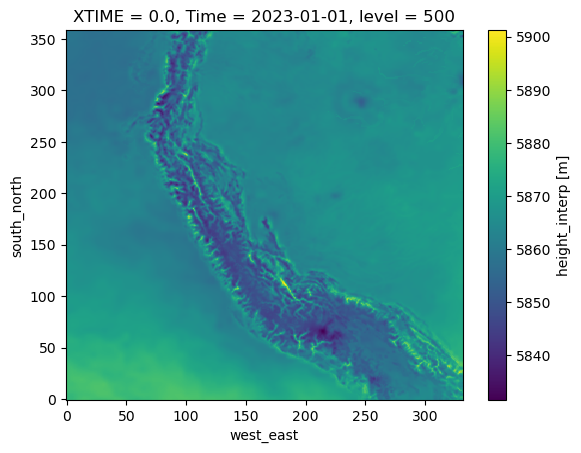

In [182]:
ht_500.plot()

### Funcion vertcross ###
La idea es dibujar una línea horizontal en la superficie, y la sección transversal se define como un plano vertical que se extiende hacia arriba desde esta línea.

 - El nuevo eje x para un gráfico de sección transversal son los puntos a lo largo de la línea que hiciste. La línea se puede definir por:
     - Defininiendo un punto de inicio y un punto final mediante el uso de coordenadas de cuadrícula (x, y) o coordenadas (latitud, longitud).
     - Definiendo un punto de pivote y un ángulo, que es útil para secciones transversales que abarcarán la mayor parte del dominio.
    - El nuevo eje Y será un conjunto de niveles verticales en intervalos predeterminados (incrementos del 1 %) o puede elegirlos usted mismo.
 
### Uso de la clase CoordPair con vertcross ###
Un CoordPair simplemente se usa para almacenar coordenadas (x, y) o coordenadas (lat, lon). También es posible tener (x, y, lat, lon), pero eso se usa principalmente para metadatos.

El CoordPair se utilizará para definir su línea de sección transversal.

In [143]:
# Use single file path (wrfin) for this example
# Use una ruta de archivo unica (wrfin) para este ejemplo (1 tiempo)

# Use the wrfin XLAT and XLONG variables to create coordinates
# Use las variables wrfin XLAT y XLONG para crear coordenadas
lat_coords = wrfin.variables['XLAT']
lon_coords = wrfin.variables['XLONG']

# Numpy is used to identify the start and stop lat/lon coordinate pairs
# Numpy se utiliza para identificar los pares de coordenadas de latitud/longitud de inicio y fin
coord_start = (np.amin(lat_coords), np.amin(lon_coords))
coord_end = (np.amax(lat_coords), np.amax(lon_coords))

start_point = CoordPair(lat=coord_start[0],lon=coord_start[1]) # Coordinate selected this way because of coordpair 
end_point = CoordPair(lat=coord_end[0],lon=coord_end[1])       # outputting lat in pos 0 and lon in pos 1 
# Coordenada seleccionada de esta manera por coordpair / # salida lat en pos 0 y lon en pos 1



# Let's get wind speed in kts
# Obtengamos la velocidad del viento en kts, en este caso 'wspd_wdir'
wspd_wdir = getvar(wrfin, "wspd_wdir", timeidx=0, units="kt")           

# Get the height levels
# obtengamos los niveles de altura, en este caso 'ht'
ht = getvar(wrfin, "z", timeidx=0)

# Compute the wind speed cross section
# Calcular la sección transversal de la velocidad del viento con la funcion 'vertcross' y agregando los puntos 
wspd_cross = vertcross(wspd_wdir, ht, wrfin=wrfin, start_point=start_point, end_point=end_point)

# vertcross(field3d, vert, desiredlev)
# field3d: field to be interpolated nx x ny x nz
# vert: vertical coordinate
# wrfin=wrfin: This is used to obtain the map projection when using latitude,longitude coordinates.
# Start/end_point represent the location on the ground, the 'x' coord on a xz-plane

# vertcross(field3d, vert, desiredlev)
# field3d: campo a interpolar nx x ny x nz
# vert: coordenadas verticales
# wrfin=wrfin: Esto se usa para obtener la proyección del mapa cuando se usan coordenadas de latitud y longitud.
# Start/end_point representar la ubicación en el suelo, la coordenada 'x' en un plano xz

print(wspd_cross) #se puede ver wspd_wdir: 2, vertical: 100, cross_line_idx: 488

#Coordinates:
 # * wspd_wdir  (wspd_wdir) <U4 'wspd' 'wdir'
 #   XTIME      float32 0.0
 #   Time       datetime64[ns] 2023-01-01
 #   xy_loc     (cross_line_idx) object CoordPair(x=0.0, y=0.0) ... CoordPair(...
 # * vertical   (vertical) float32 0.0 202.2 404.3 ... 1.981e+04 2.001e+04"


<xarray.DataArray 'wspd_wdir_cross' (wspd_wdir: 2, vertical: 100,
                                     cross_line_idx: 488)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [ 14.997769,  15.040915,  15.004633, ...,        nan,
                nan,        nan],
        [ 14.86256 ,  14.880344,  14.819707, ...,        nan,
                nan,        nan],
        ...,
        [ 11.236917,  11.143198,  11.089678, ...,  11.038265,
          11.047063,  11.070331],
        [  9.345884,   9.229076,   9.150853, ...,  15.910004,
          15.93743 ,  15.971789],
        [  7.454833,   7.314935,   7.21201 , ...,  20.78179 ,
          20.827847,  20.873295]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [143.10728 , 143.32362 , 143.55048 , ...,        nan,
                nan,        nan],
        [142.57181 , 142.67233 , 142.76369 , ...,        nan,
                nan,        na


La función wrf.vertical_cross_section() en WRF-Python se utiliza para crear secciones transversales verticales de variables en 
un modelo WRF. Permite visualizar cómo varían las variables a medida que se cruzan diferentes niveles verticales en una
dirección horizontal específica.

La función wrf.vertical_cross_section() toma varios argumentos, incluyendo el objeto de datos de WRF, la variable que se
desea visualizar, la latitud y longitud de los puntos inicial y final de la línea de sección, y opcionalmente el número 
de puntos a lo largo de la sección y el nivel de altura deseado. La función devuelve un objeto de datos de xarray con 
la sección transversal vertical de la variable especificada.

Al visualizar la sección transversal vertical, se obtiene una representación gráfica de cómo varía la variable a
medida que se atraviesan los diferentes niveles de la atmósfera a lo largo de la línea de sección. Esto puede ser
útil para analizar patrones verticales, identificar características como frentes o núcleos de vórtice, y estudiar 
la estructura vertical de fenómenos meteorológicos.

En resumen, wrf.vertical_cross_section() es una función en WRF-Python que permite crear y visualizar 
secciones transversales verticales de variables en modelos WRF para analizar la estructura vertical de la atmósfera


(array([54382., 12832., 10823.,  4914.,  1946.,  1005.,   703.,  1265.,
         3130.,  4086.]),
 array([1.1274325e-01, 3.6032345e+01, 7.1951950e+01, 1.0787155e+02,
        1.4379115e+02, 1.7971075e+02, 2.1563036e+02, 2.5154997e+02,
        2.8746957e+02, 3.2338916e+02, 3.5930878e+02], dtype=float32),
 <BarContainer object of 10 artists>)

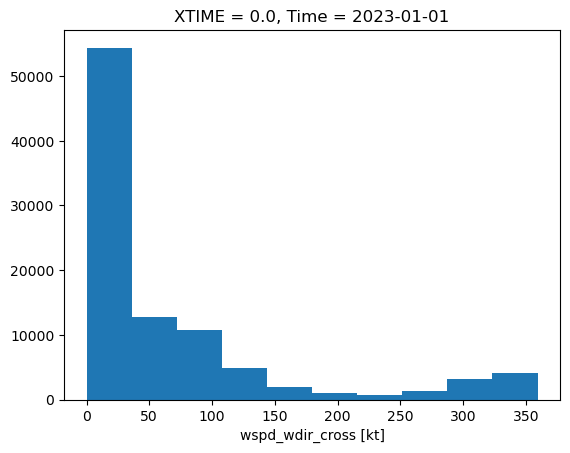

In [181]:
wspd_cross.plot()

# ¡A Plotear, manos a la obra manos! #

Nos centraremos principalmente en trazar con Cartopy en esta sección del tutorial. No cubriremos el trazado con Basemap ya que Basemap no [sera siendo mantenido](https://matplotlib.org/basemap/users/intro.html#:~:text=The%20Cartopy%20project%20will%20replace,switching%20over%20to%20use%20Cartopy.) y anima a los usuarios a utilizar Cartopy en su lugar. Si tiene interés en los ejemplos de mapas base, hay ejemplos en la página de lectura de documentos de WRF-Python que cubren el proceso de uso [Basemap with WRF-Python](https://wrf-python.readthedocs.io/en/latest/plot.html#matplotlib-with-basemap).

## Descripción general de la función auxiliar de WRF-Python ##
 - **get_cartopy**: Devuelve el objeto de mapeo utilizado por cartopy 
 - **latlon_coords**: Devuelve las variables de coordenadas de latitud y longitud.

## Empezando con una proyección cartográfica básica de la presión a nivel del mar ##

In [183]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import geopandas
import cartopy.feature as cfeature #para mapitas de peru 

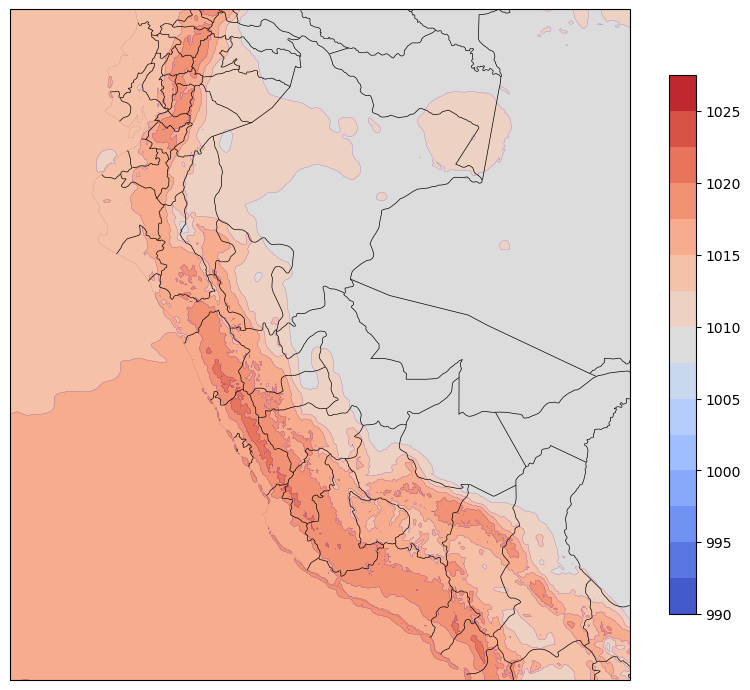

In [184]:
# Use single wrf file for this example
# Use un solo archivo wrf para este ejemplo

# Extract terrrain height variable "slp" at time index 0 using getvar
# Extraer la variable de altura del terreno "slp" en el índice de tiempo 0 usando getvar
slp = getvar(wrfin, 'slp', timeidx=0)

# Extract cartopy object and lat/lon coordinates using get_cartopy and latlon_coords
cart_proj = get_cartopy(slp)
lats, lons = latlon_coords(slp)

# Verify cartopy object and lat/lon coordinates were processed
# print(cart_proj, '\n', lats,'\n', lons)



# Create a figure and axes object
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection=cart_proj) # Set map projection with cart_proj. What do you notice about the map displayed?



# Add features to axes object 
ax.coastlines(linewidth=0.05) 
# Add features to the map like contour lines
# Set contour levels 
#lvl = np.arange(0, 1000, 2.5) # Non-inclusive of end value (1030)
lvl = np.arange(990, 1030, 2.5) # Non-inclusive of end value (1030)



#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
ax.add_feature(cfeature.LAND)


# Add contour lines
plt.contour(lons,
            lats,
            slp, 
            levels=lvl,
            colors='blue',
            transform=crs.PlateCarree(),
           linewidths=0.1)

# Add filled contour lines
plt.contourf(lons,
             lats,
             slp,
             levels=lvl,
             transform=crs.PlateCarree(),
             cmap='coolwarm')

# Add colorbar
plt.colorbar(ax=ax, shrink=0.7)


# Manually set extent of map projection
#ax.set_extent([-80, -68, -10, 2]) si quieres poner manualmente 

ax.set_extent([lons.min(), lons.max(), lats.min(), lats.max()])

plt.show()

# Is there data missing from this projection?



# Superposición de varios diagnósticos #

En estos ejemplos, extraeremos muchas variables y luego las superpondremos todas en una proyección.

### Temperatura del punto de rocío, presión a nivel del mar y vientos ###

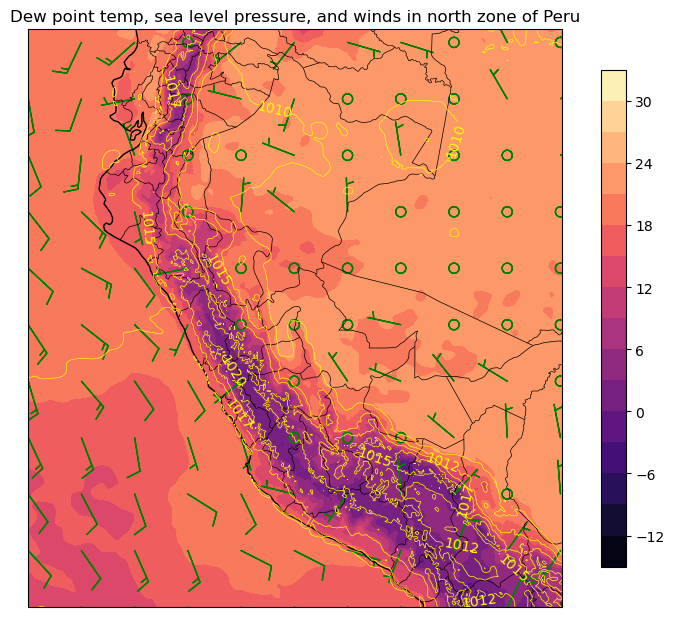

In [253]:
# Use single wrf file for this example
# Use un solo archivo wrf para este ejemplo

# Get "slp", "td2", "ua", and "va" variables at time index 0
# obten las variables "slp", "td2", "ua", y "va" en time index 0

slp = getvar(wrfin, "slp", timeidx=0)
td2 = getvar(wrfin, "td2", timeidx=0, units="degC") # Use units "degC"
u_sfc = getvar(wrfin, "ua", timeidx=0, units="kt")[0,:] # subset data to match size of td2 and slp, use units "kt"
v_sfc = getvar(wrfin, "va", timeidx=0, units="kt")[0,:]

# Get the cartopy object and the lat,lon coords
# Obtener los cartopy object y las coordenadas de latitud y longitud
cart_proj = get_cartopy(slp)
lats, lons = latlon_coords(slp)

# Create a figure and get the axes object
# Crea una figura y obtén el objeto de los ejes
fig = plt.figure(figsize=(10, 7.5))
ax = plt.axes(projection=cart_proj)

#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
#estas son características adicionales que puede agregar a las gráficas geográficas (como fronteras, ríos, lagos, etc.)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
ax.add_feature(cfeature.LAND)


# Add projection features
# Agregar caracteristicas de proyección
ax.coastlines(linewidth=1)

# Manually setting the contour levels
# Configuración manual de los niveles de contorno
slp_levels = np.arange(960, 1040, 2.5)
td2_levels = np.arange(-15, 35, 3)

# Make sea level pressure contour lines.
# Hacer líneas de contorno de presión a nivel del mar.
slp_contours = plt.contour(lons,
                           lats,
                           slp,
                           levels=slp_levels,
                           colors='yellow',
                           transform=crs.PlateCarree(),
                          linewidths=0.5)

# Make filled contours for 2m dewpoint temperature.
# Realice contornos rellenos para una temperatura de punto de rocío de 2 m.
plt.contourf(lons,
             lats,
             td2,
             levels=td2_levels,
             transform=crs.PlateCarree(),
             cmap='magma',
             colorbar=False)

# Plot the wind barbs, but only plot ~7 barbs in each direction.
# Traza las púas del viento, pero solo traza ~7 púas en cada dirección.
thin = [int(x/10.) for x in lons.shape]
plt.barbs(to_np(lons[::thin[0], ::thin[1]]), # Why are we using to_np here? # ¿Por qué estamos usando to_np aquí?
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_sfc[::thin[0], ::thin[1]]),
          to_np(v_sfc[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          color = 'green')

# Add contour labels for pressure
# Agregue etiquetas de contorno para la presión
plt.clabel(slp_contours, fmt="%i")

# Add a color bar. The shrink often needs to be set 
# Agregue una barra de color. El encogimiento a menudo necesita ser establecido
# by trial and error.
plt.colorbar(ax=ax, shrink=.86, extendrect=True)

# Set the map bounds
# Establecer los límites del mapa
plt.xlim(cartopy_xlim(slp))
plt.ylim(cartopy_ylim(slp))
plt.title('Dew point temp, sea level pressure, and winds in north zone of Peru')
plt.show()


In [328]:
#slp = getvar(wrf_files, 'slp', timeidx=4, method='cat')
print(slp)

<xarray.DataArray 'Time' ()>
array('2023-01-02T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    XTIME    float32 1.44e+03
    Time     datetime64[ns] 2023-01-02


## EJEMPLO 2 ##


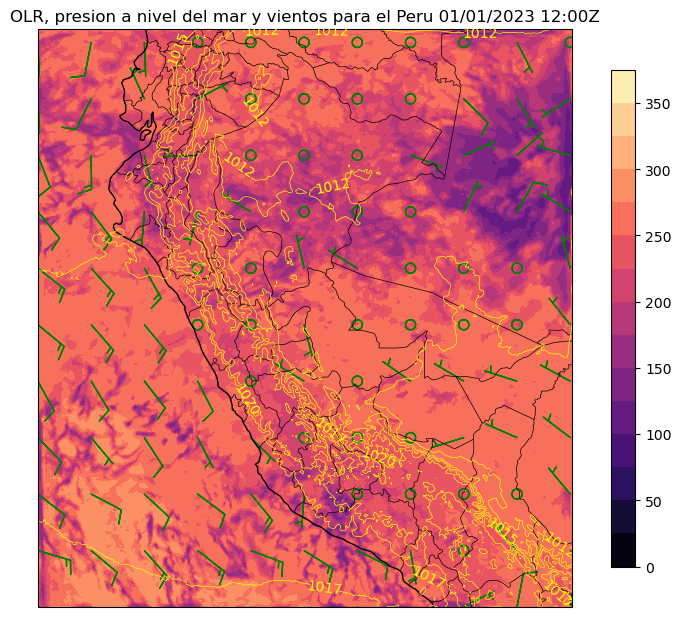

In [288]:
# Use single wrf_files for this example
# Usando el archivo wrf_files para este ejemplo, cambiando el time index

# Get "slp", "td2", "ua", and "va" variables at time index 0
# obten las variables "slp", "td2", "ua", y "va" en time index 0

slp = getvar(wrf_files, "slp", timeidx=2)
td2 = getvar(wrf_files, "OLR", timeidx=2) #
u_sfc = getvar(wrf_files, "ua", timeidx=2, units="kt")[0,:] # subset data to match size of td2 and slp, use units "kt"
v_sfc = getvar(wrf_files, "va", timeidx=2, units="kt")[0,:]

# Get the cartopy object and the lat,lon coords
# Obtener los cartopy object y las coordenadas de latitud y longitud
cart_proj = get_cartopy(slp)
lats, lons = latlon_coords(slp)

# Create a figure and get the axes object
# Crea una figura y obtén el objeto de los ejes
fig = plt.figure(figsize=(10, 7.5))
ax = plt.axes(projection=cart_proj)

#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
#estas son características adicionales que puede agregar a las gráficas geográficas (como fronteras, ríos, lagos, etc.)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
ax.add_feature(cfeature.LAND)


# Add projection features
# Agregar caracteristicas de proyección
ax.coastlines(linewidth=1)

# Manually setting the contour levels
# Configuración manual de los niveles de contorno
slp_levels = np.arange(960, 1040, 2.5)
td2_levels = np.arange(0, 400, 25)

# Make sea level pressure contour lines.
# Hacer líneas de contorno de presión a nivel del mar.
slp_contours = plt.contour(lons,
                           lats,
                           slp,
                           levels=slp_levels,
                           colors='yellow',
                           transform=crs.PlateCarree(),
                          linewidths=0.5)

# Make filled contours for 2m dewpoint temperature.
# Realice contornos rellenos para una temperatura de punto de rocío de 2 m.
plt.contourf(lons,
             lats,
             td2,
             levels=td2_levels,
             transform=crs.PlateCarree(),
             cmap='magma',
             colorbar=False)

# Plot the wind barbs, but only plot ~7 barbs in each direction.
# Traza las púas del viento, pero solo traza ~7 púas en cada dirección.
thin = [int(x/10.) for x in lons.shape]
plt.barbs(to_np(lons[::thin[0], ::thin[1]]), # Why are we using to_np here? # ¿Por qué estamos usando to_np aquí?
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_sfc[::thin[0], ::thin[1]]),
          to_np(v_sfc[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          color = 'green')

# Add contour labels for pressure
# Agregue etiquetas de contorno para la presión
plt.clabel(slp_contours, fmt="%i")

# Add a color bar. The shrink often needs to be set 
# Agregue una barra de color. El encogimiento a menudo necesita ser establecido
# by trial and error.
plt.colorbar(ax=ax, shrink=.86, extendrect=True)

# Set the map bounds
# Establecer los límites del mapa
plt.xlim(cartopy_xlim(slp))
plt.ylim(cartopy_ylim(slp))
plt.title('OLR, presion a nivel del mar y vientos para el Peru 01/01/2023 12:00Z')
plt.show()


 **La convección tiende a reducir la OLR debido a la presencia de nubes y tormentas** que obstaculizan la emisión de radiación infrarroja hacia el espacio. La OLR más baja indica la presencia de una mayor actividad convectiva en la atmósfera, mientras que una OLR más alta sugiere una menor actividad convectiva. Esta relación entre la convección y la OLR se utiliza en el análisis meteorológico y en la detección de fenómenos como tormentas y sistemas convectivos.

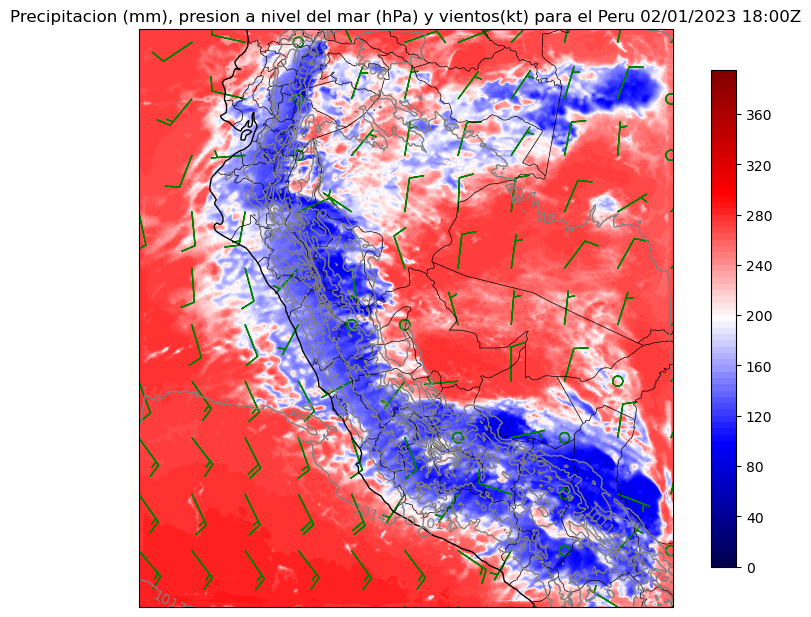

In [370]:
# Use single wrf_files for this example
# Usando el archivo wrf_files para este ejemplo, cambiando el time index

# Get "slp", "td2", "ua", and "va" variables at time index 0
# obten las variables "slp", "td2", "ua", y "va" en time index 0
tiempo=8 #0 empieza con 01-01-2023 00:00Z #1, 4, 7, 10, va cambiando el dia
slp = getvar(wrf_files, "slp", timeidx=tiempo)
td2 = getvar(wrf_files, "OLR", timeidx=tiempo) #
u_sfc = getvar(wrf_files, "ua", timeidx=tiempo, units="kt")[0,:] # subset data to match size of td2 and slp, use units "kt"
v_sfc = getvar(wrf_files, "va", timeidx=tiempo, units="kt")[0,:]

# Get the cartopy object and the lat,lon coords
# Obtener los cartopy object y las coordenadas de latitud y longitud
cart_proj = get_cartopy(slp)
lats, lons = latlon_coords(slp)

# Create a figure and get the axes object
# Crea una figura y obtén el objeto de los ejes
fig = plt.figure(figsize=(10, 7.5))
ax = plt.axes(projection=cart_proj)

#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
#estas son características adicionales que puede agregar a las gráficas geográficas (como fronteras, ríos, lagos, etc.)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
ax.add_feature(cfeature.LAND)


# Add projection features
# Agregar caracteristicas de proyección
ax.coastlines(linewidth=1)

# Manually setting the contour levels
# Configuración manual de los niveles de contorno
slp_levels = np.arange(960, 1040, 3)
td2_levels = np.arange(0, 400, 5)

# Make sea level pressure contour lines.
# Hacer líneas de contorno de presión a nivel del mar.
slp_contours = plt.contour(lons,
                           lats,
                           slp,
                           levels=slp_levels,
                           colors='gray',
                           transform=crs.PlateCarree(),
                          linewidths=1)

# Make filled contours for 2m dewpoint temperature.
# Realice contornos rellenos para una temperatura de punto de rocío de 2 m.
plt.contourf(lons,
             lats,
             td2,
             levels=td2_levels,
             transform=crs.PlateCarree(),
             cmap='seismic',
             colorbar=False)

# Plot the wind barbs, but only plot ~7 barbs in each direction.
# Traza las púas del viento, pero solo traza ~7 púas en cada dirección.
thin = [int(x/10.) for x in lons.shape]
plt.barbs(to_np(lons[::thin[0], ::thin[1]]), # Why are we using to_np here? # ¿Por qué estamos usando to_np aquí?
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_sfc[::thin[0], ::thin[1]]),
          to_np(v_sfc[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          color = 'green')

# Add contour labels for pressure
# Agregue etiquetas de contorno para la presión
plt.clabel(slp_contours, fmt="%i")

# Add a color bar. The shrink often needs to be set 
# Agregue una barra de color. El encogimiento a menudo necesita ser establecido
# by trial and error.
plt.colorbar(ax=ax, shrink=.86, extendrect=True)

# Set the map bounds
# Establecer los límites del mapa
plt.xlim(cartopy_xlim(slp))
plt.ylim(cartopy_ylim(slp))
plt.title('Radiacion en onda larga saliente OLR (W/m2), presion a nivel del mar (hPa) y vientos(kt) para el Peru 02/01/2023 18:00Z')
plt.show()


In [341]:
######EJEMPLO COMO HACER UN BUCLE CADA 6 HORAS PARA LA FIGURA
from datetime import datetime, timedelta

tiempo_inicial = 0
tiempo_final = 25
fecha_inicial = datetime(2023, 1, 1)

for tiempo in range(tiempo_inicial, tiempo_final):
    delta = timedelta(hours=6)
    fecha_actual = fecha_inicial + tiempo * delta
    print(f"Índice de tiempo {tiempo} corresponde a {fecha_actual}")

Índice de tiempo 0 corresponde a 2023-01-01 00:00:00
Índice de tiempo 1 corresponde a 2023-01-01 06:00:00
Índice de tiempo 2 corresponde a 2023-01-01 12:00:00
Índice de tiempo 3 corresponde a 2023-01-01 18:00:00
Índice de tiempo 4 corresponde a 2023-01-02 00:00:00
Índice de tiempo 5 corresponde a 2023-01-02 06:00:00
Índice de tiempo 6 corresponde a 2023-01-02 12:00:00
Índice de tiempo 7 corresponde a 2023-01-02 18:00:00
Índice de tiempo 8 corresponde a 2023-01-03 00:00:00
Índice de tiempo 9 corresponde a 2023-01-03 06:00:00
Índice de tiempo 10 corresponde a 2023-01-03 12:00:00
Índice de tiempo 11 corresponde a 2023-01-03 18:00:00
Índice de tiempo 12 corresponde a 2023-01-04 00:00:00
Índice de tiempo 13 corresponde a 2023-01-04 06:00:00
Índice de tiempo 14 corresponde a 2023-01-04 12:00:00
Índice de tiempo 15 corresponde a 2023-01-04 18:00:00
Índice de tiempo 16 corresponde a 2023-01-05 00:00:00
Índice de tiempo 17 corresponde a 2023-01-05 06:00:00
Índice de tiempo 18 corresponde a 2023

<xarray.DataArray 'OLR' (south_north: 359, west_east: 332)>
array([[280.61636, 280.4971 , 275.63556, ..., 251.73924, 252.41573,
        256.0993 ],
       [278.67117, 280.2435 , 276.06137, ..., 254.05115, 255.4212 ,
        256.6656 ],
       [280.3858 , 278.701  , 271.20184, ..., 255.70442, 257.40112,
        257.12662],
       ...,
       [236.89041, 251.85423, 264.36618, ..., 249.91318, 249.07779,
        257.3538 ],
       [238.76689, 253.83891, 261.09784, ..., 255.99168, 255.16719,
        256.52264],
       [264.666  , 264.61627, 264.6206 , ..., 260.4562 , 248.76703,
        246.84944]], dtype=float32)
Coordinates:
    XLONG    (south_north, west_east) float32 -83.74 -83.68 ... -65.71 -65.65
    XLAT     (south_north, west_east) float32 -18.5 -18.5 ... 0.7316 0.7316
    XTIME    float32 360.0
    Time     datetime64[ns] 2023-01-01T06:00:00
Dimensions without coordinates: south_north, west_east
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  TOA OUTGOING LONG WAVE
    units:        W m-2
    stagger:      
    coordinates:  XLONG XLAT XTIME
    projection:   Mercator(stand_lon=-74.69499969482422, moad_cen_lat=-9.0120...

## EJEMPLO 4: PRECIPITACION, PRESION A NIVEL DEL MAR Y VIENTOS  CON BUCLE ##

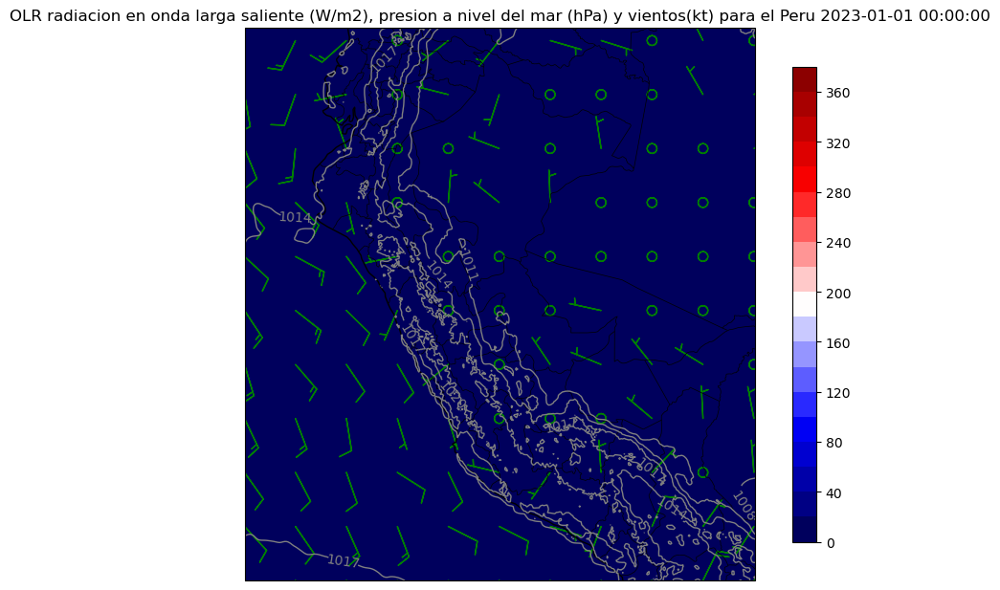

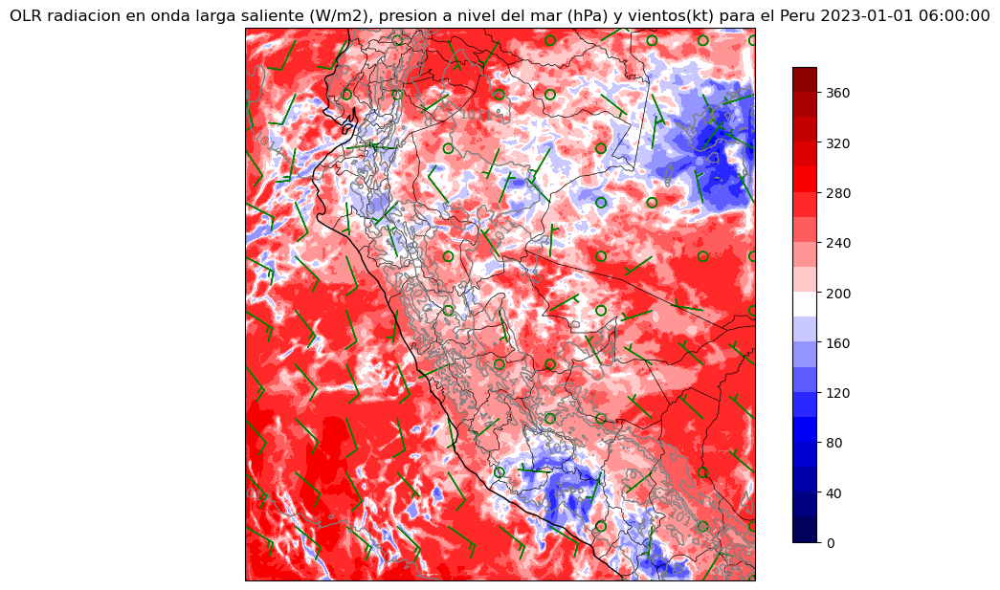

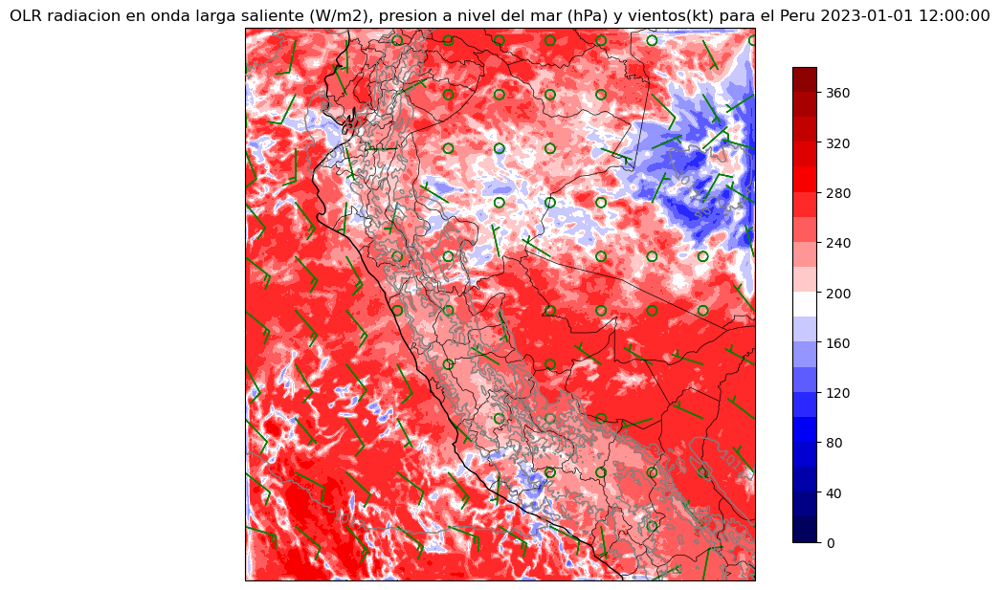

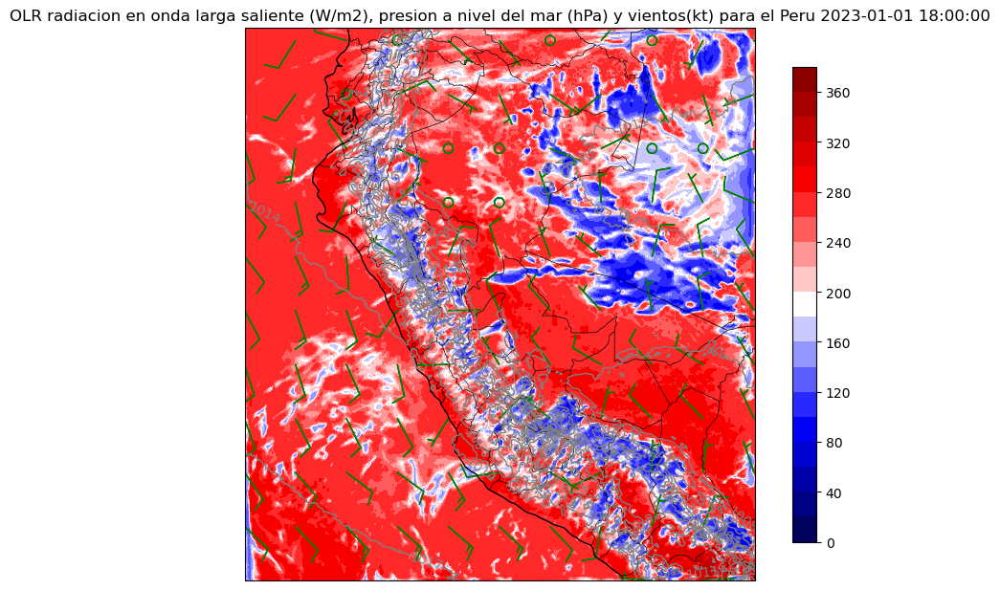

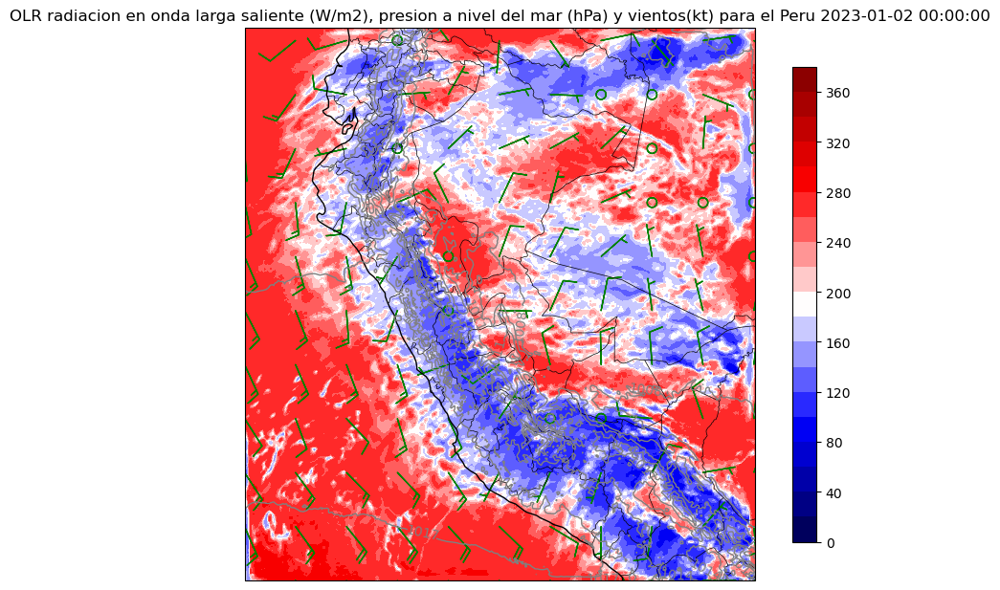

...

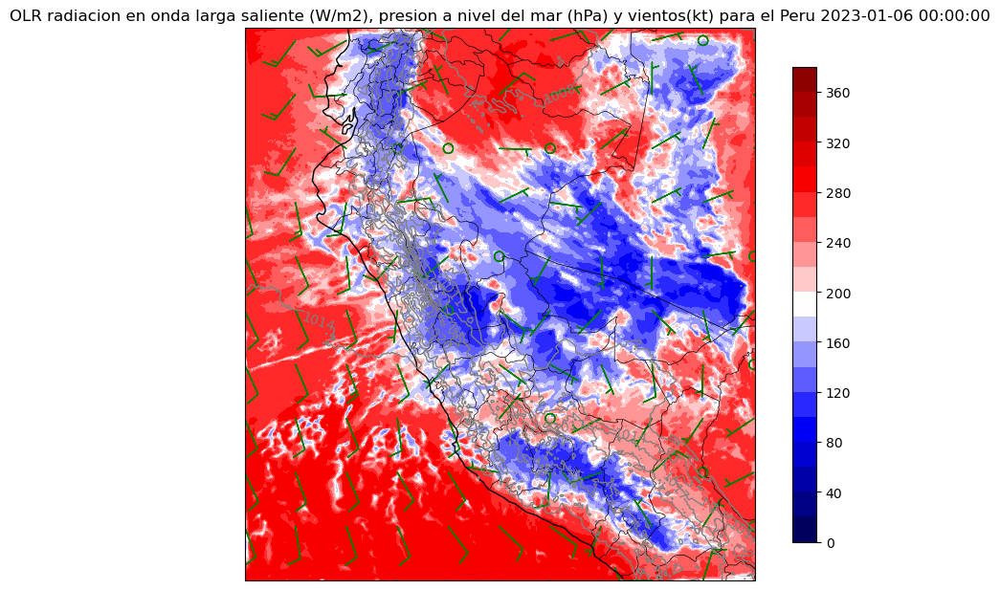

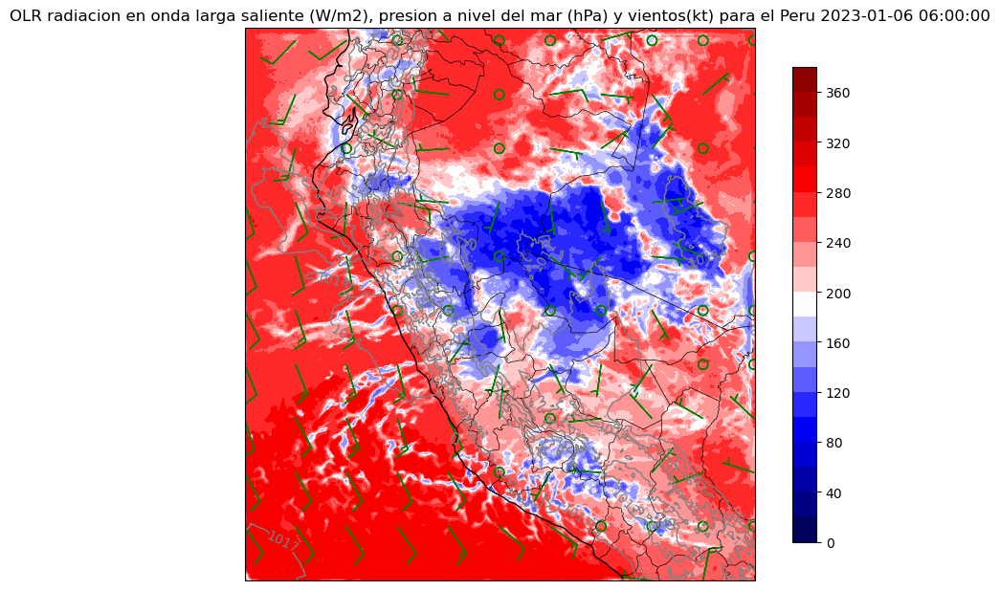

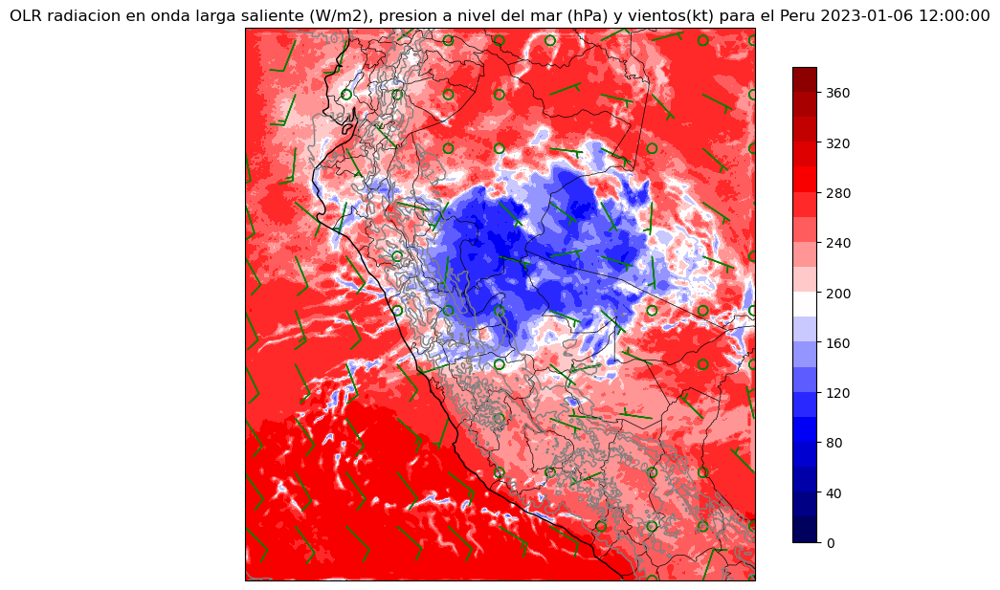

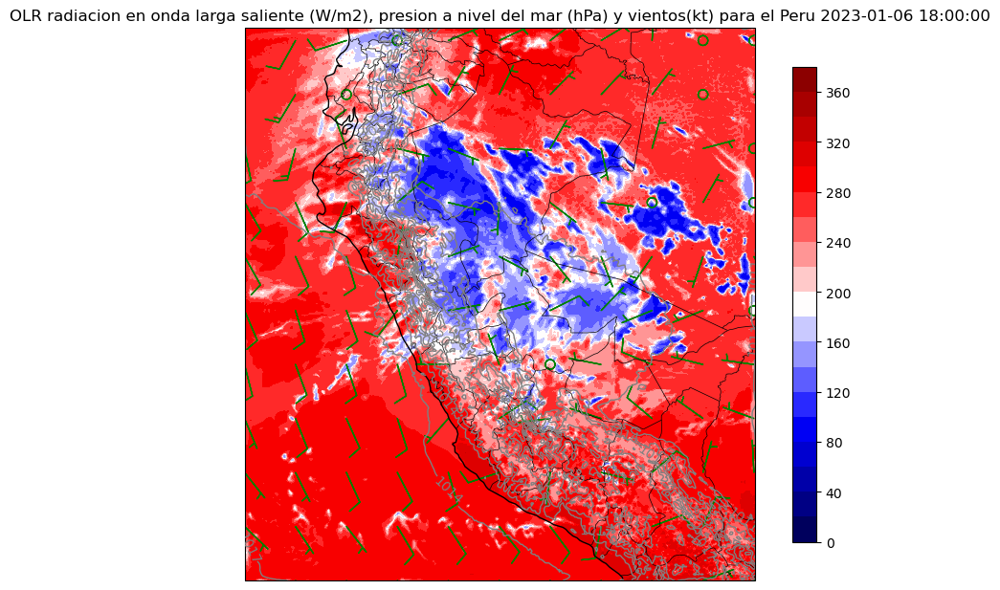

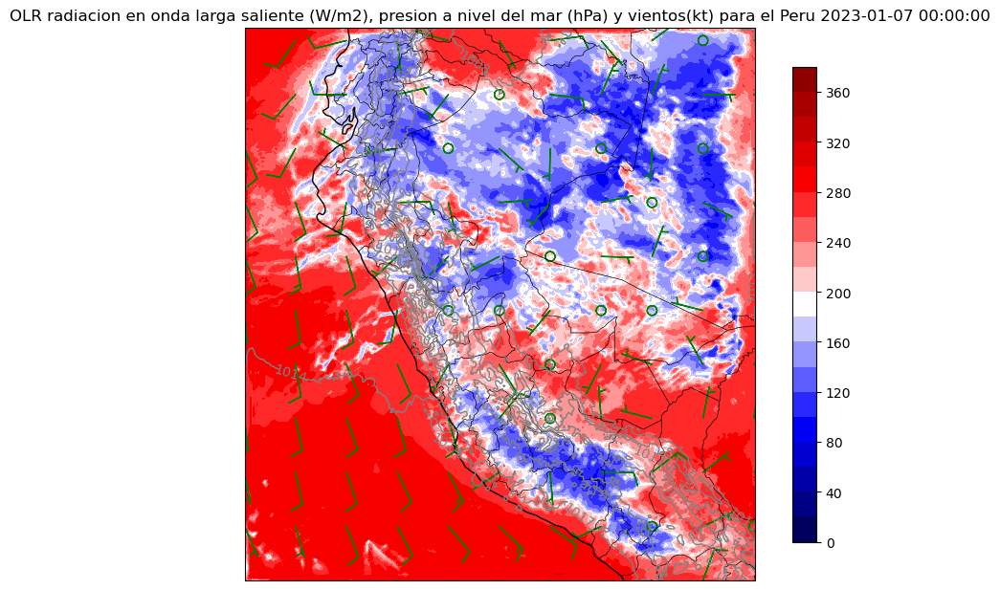

Figuras guardadas exitosamente.


In [374]:
# Use single wrf_files for this example
# Usando el archivo wrf_files para este ejemplo, cambiando el time index

# Ruta donde se guardarán las figuras
ruta_guardado = "C:/Users/andre/Documents/trabajos/WRF_SELVA/DATOS_WRF/PERU/ENERO/SALIDAS"

# Get "slp", "td2", "ua", and "va" variables at time index 0
# obten las variables "slp", "td2", "ua", y "va" en time index 0
#0 empieza con 01-01-2023 00:00Z #1, 4, 7, 10, va cambiando el dia


tiempo_inicial = 0 #primera figura
tiempo_final = 24 #segunda figura
fecha_inicial = datetime(2023, 1, 1)

for tiempo in range(tiempo_inicial, tiempo_final + 1):  # Tiempo del 0 al 25
    
    #Este usare para que el tiempo se relacione con mis condiciones y agregarlo al titulo
    delta = timedelta(hours=6) #ojo son cada 6 horas 
    fecha_actual = fecha_inicial + tiempo * delta #fecha para cada figura
    
    #Este usare para el nombre de cada archivo(ploteo)
    fecha_actual_str = fecha_actual.strftime("%Y-%m-%d_%H%M%S") 
    
    slp = getvar(wrf_files, "slp", timeidx=tiempo)
    td2 = getvar(wrf_files, "OLR", timeidx=tiempo) #puedes cambiar la variable " "
    u_sfc = getvar(wrf_files, "ua", timeidx=tiempo, units="kt")[0,:] # subset data to match size of td2 and slp, use units "kt"
    v_sfc = getvar(wrf_files, "va", timeidx=tiempo, units="kt")[0,:]

    # Get the cartopy object and the lat,lon coords
    # Obtener los cartopy object y las coordenadas de latitud y longitud
    cart_proj = get_cartopy(slp)
    lats, lons = latlon_coords(slp)
    
    # Create a figure and get the axes object
    # Crea una figura y obtén el objeto de los ejes
    fig = plt.figure(figsize=(10, 7.5))
    ax = plt.axes(projection=cart_proj)
    #these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
    #estas son características adicionales que puede agregar a las gráficas geográficas (como fronteras, ríos, lagos, etc.)
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
    ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
    ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
    ax.add_feature(cfeature.LAND)
    # Add projection features
    # Agregar caracteristicas de proyección
    ax.coastlines(linewidth=1)
    
    # Manually setting the contour levels
    # Configuración manual de los niveles de contorno
    slp_levels = np.arange(960, 1040, 3)
    td2_levels = np.arange(0, 400, 20)
    
    # Make sea level pressure contour lines.
    # Hacer líneas de contorno de presión a nivel del mar.
    slp_contours = plt.contour(lons,
                           lats,
                           slp,
                           levels=slp_levels,
                           colors='gray',
                           transform=crs.PlateCarree(),
                          linewidths=1)
    # Make filled contours for 2m dewpoint temperature
    # Realice contornos rellenos para una temperatura de punto de rocío de 2 m.
    plt.contourf(lons,
             lats,
             td2,
             levels=td2_levels,
             transform=crs.PlateCarree(),
             cmap='seismic',
             colorbar=False)
    # Plot the wind barbs, but only plot ~7 barbs in each direction.
    # Traza las púas del viento, pero solo traza ~7 púas en cada dirección.
    thin = [int(x/10.) for x in lons.shape]
    plt.barbs(to_np(lons[::thin[0], ::thin[1]]), # Why are we using to_np here? # ¿Por qué estamos usando to_np aquí?
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_sfc[::thin[0], ::thin[1]]),
          to_np(v_sfc[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          color = 'green')
    # Add contour labels for pressure
    # Agregue etiquetas de contorno para la presión
    plt.clabel(slp_contours, fmt="%i")
    
    # Add a color bar. The shrink often needs to be set 
    # Agregue una barra de color. El encogimiento a menudo necesita ser establecido
    # by trial and error.
    plt.colorbar(ax=ax, shrink=.86, extendrect=True)
        
    # Set the map bounds
    # Establecer los límites del mapa
    plt.xlim(cartopy_xlim(slp))
    plt.ylim(cartopy_ylim(slp))
    plt.title(f'OLR radiacion en onda larga saliente (W/m2), presion a nivel del mar (hPa) y vientos(kt) para el Peru {fecha_actual}')
    
    
    
    # Resto del código para configurar y plotear la figura...

    # Guardar la figura en formato PNG en la ubicación especificada
    nombre_archivo = f"figura_OLR_{tiempo}_{fecha_actual_str}.png"
    ruta_archivo = os.path.join(ruta_guardado, nombre_archivo)
    plt.savefig(ruta_archivo, dpi=300)  # Ajusta el dpi según tus necesidades

    
    plt.show()
    plt.close(fig)
    # Cerrar la figura para liberar memoria
    

print("Figuras guardadas exitosamente.")


## EJEMPLO 5: OLR, PRESION A NIVEL DEL MAR Y VIENTOS  CON BUCLE ##

In [ ]:
# Use single wrf_files for this example
# Usando el archivo wrf_files para este ejemplo, cambiando el time index

# Ruta donde se guardarán las figuras
ruta_guardado = "C:/Users/andre/Documents/trabajos/WRF_SELVA/DATOS_WRF/PERU/ENERO/SALIDAS"

# Get "slp", "td2", "ua", and "va" variables at time index 0
# obten las variables "slp", "td2", "ua", y "va" en time index 0
#0 empieza con 01-01-2023 00:00Z #1, 4, 7, 10, va cambiando el dia


tiempo_inicial = 0 #primera figura
tiempo_final = 24 #segunda figura
fecha_inicial = datetime(2023, 1, 1)

for tiempo in range(tiempo_inicial, tiempo_final + 1):  # Tiempo del 0 al 25
    
    #Este usare para que el tiempo se relacione con mis condiciones y agregarlo al titulo
    delta = timedelta(hours=6) #ojo son cada 6 horas 
    fecha_actual = fecha_inicial + tiempo * delta #fecha para cada figura
    
    #Este usare para el nombre de cada archivo(ploteo)
    fecha_actual_str = fecha_actual.strftime("%Y-%m-%d_%H%M%S") 
    
    slp = getvar(wrf_files, "slp", timeidx=tiempo)
    td2 = getvar(wrf_files, "OLR", timeidx=tiempo) #cambiar variable " " si quieres otra 
    u_sfc = getvar(wrf_files, "ua", timeidx=tiempo, units="kt")[0,:] # subset data to match size of td2 and slp, use units "kt"
    v_sfc = getvar(wrf_files, "va", timeidx=tiempo, units="kt")[0,:]

    # Get the cartopy object and the lat,lon coords
    # Obtener los cartopy object y las coordenadas de latitud y longitud
    cart_proj = get_cartopy(slp)
    lats, lons = latlon_coords(slp)
    
    # Create a figure and get the axes object
    # Crea una figura y obtén el objeto de los ejes
    fig = plt.figure(figsize=(10, 7.5))
    ax = plt.axes(projection=cart_proj)
    #these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
    #estas son características adicionales que puede agregar a las gráficas geográficas (como fronteras, ríos, lagos, etc.)
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
    ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
    ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
    ax.add_feature(cfeature.LAND)
    # Add projection features
    # Agregar caracteristicas de proyección
    ax.coastlines(linewidth=1)
    
    # Manually setting the contour levels
    # Configuración manual de los niveles de contorno
    slp_levels = np.arange(960, 1040, 3)
    td2_levels = np.arange(1, 100, 5)
    
    # Make sea level pressure contour lines.
    # Hacer líneas de contorno de presión a nivel del mar.
    slp_contours = plt.contour(lons,
                           lats,
                           slp,
                           levels=slp_levels,
                           colors='gray',
                           transform=crs.PlateCarree(),
                          linewidths=1)
    # Make filled contours for 2m dewpoint temperature
    # Realice contornos rellenos para una temperatura de punto de rocío de 2 m.
    plt.contourf(lons,
             lats,
             td2,
             levels=td2_levels,
             transform=crs.PlateCarree(),
             cmap='jet',
             colorbar=False,
            zorder=3)
    # Plot the wind barbs, but only plot ~7 barbs in each direction.
    # Traza las púas del viento, pero solo traza ~7 púas en cada dirección.
    thin = [int(x/10.) for x in lons.shape]
    plt.barbs(to_np(lons[::thin[0], ::thin[1]]), # Why are we using to_np here? # ¿Por qué estamos usando to_np aquí?
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_sfc[::thin[0], ::thin[1]]),
          to_np(v_sfc[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          color = 'green')
    # Add contour labels for pressure
    # Agregue etiquetas de contorno para la presión
    plt.clabel(slp_contours, fmt="%i")
    
    # Add a color bar. The shrink often needs to be set 
    # Agregue una barra de color. El encogimiento a menudo necesita ser establecido
    # by trial and error.
    plt.colorbar(ax=ax, shrink=.86, extendrect=True)
        
    # Set the map bounds
    # Establecer los límites del mapa
    plt.xlim(cartopy_xlim(slp))
    plt.ylim(cartopy_ylim(slp))
    plt.title(f'Precipitacion RAINCC (mm), presion a nivel del mar (hPa) y vientos(kt) para el Peru {fecha_actual}')
    
    
    
    # Resto del código para configurar y plotear la figura...

    # Guardar la figura en formato PNG en la ubicación especificada
    nombre_archivo = f"figura_OLR_{tiempo}_{fecha_actual_str}.png"
    ruta_archivo = os.path.join(ruta_guardado, nombre_archivo)
    plt.savefig(ruta_archivo, dpi=300)  # Ajusta el dpi según tus necesidades

    
    plt.show()
    plt.close(fig)
    # Cerrar la figura para liberar memoria
    

print("Figuras guardadas exitosamente.")


# Alturas y vientos de 850 hPa con nivel intermedio ###

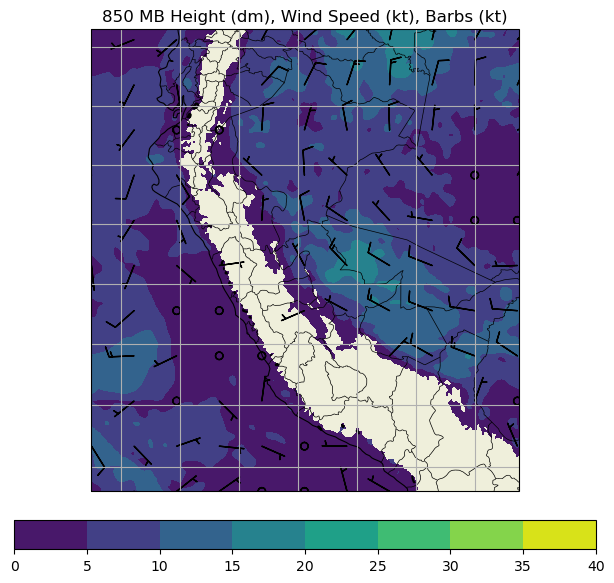

In [189]:
# Use single wrf file for this example
# Extract pressure, height, and wind variables
p = getvar(wrfin, "pressure")
z = getvar(wrfin, "z", units="dm")
ua = getvar(wrfin, "ua", units="kt")
va = getvar(wrfin, "va", units="kt")
wspd = getvar(wrfin, "wspd_wdir", units="kt")[0,:]

# Interpolate height, u and v winds, and windspeed to 850 hPa
ht_850 = interplevel(z, p, 850) 
u_850 = interplevel(ua, p, 850)
v_850 = interplevel(va, p, 850)
wspd_850 = interplevel(wspd, p, 850)

# Get the lat/lon coordinates using ht_850
lats, lons = latlon_coords(ht_850)

# Get the map projection information using ht_850
cart_proj = get_cartopy(ht_850)

# Create the figure
fig = plt.figure(figsize=(10, 7.5))
ax = plt.axes(projection=cart_proj)

#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
ax.add_feature(cfeature.LAND)

# Add coastlines to the projection
ax.coastlines(linewidth=0.8)

# Add the 850 hPa geopotential height contour lines
levels = np.arange(130., 170., 6.)
contours = plt.contour(lons,
                       lats,
                       ht_850,
                       levels=levels,
                       colors="black",
                       zorder=1,
                       transform=crs.PlateCarree())

plt.clabel(contours, inline=1, fontsize=10, fmt="%i")

# Add the wind speed filled contours
levels = [0,5,10,15,20,25,30,35,40] # Why not use np.arange/np.linspace?
#levels = [0,2,4,6,8,10,12,14,16,18,20]

wspd_contours = plt.contourf(lons,
                             lats,
                             wspd_850,
                             levels=levels,
                             cmap="viridis",
                             zorder=0,
                             transform=crs.PlateCarree())

plt.colorbar(wspd_contours, ax=ax, orientation="horizontal", 
             pad=.05, shrink=.75)

# Add the 850 hPa wind barbs, only plotting 10 barbs in each direction
# Also, skipping the border barbs.
thin = [int(x/10.) for x in lons.shape]
plt.barbs(to_np(lons[::thin[0], ::thin[1]]),
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_850[::thin[0], ::thin[1]]),
          to_np(v_850[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          length=6)

# Add gridlines for where lat/lon lines are on projection
ax.gridlines()

plt.title("850 MB Height (dm), Wind Speed (kt), Barbs (kt)")

plt.show()


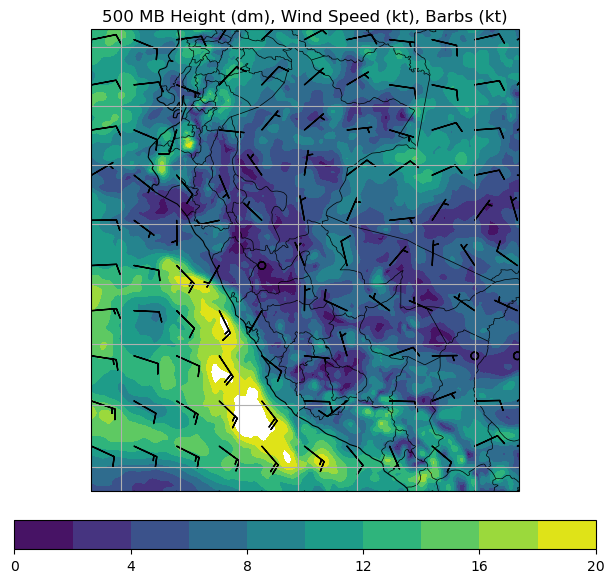

In [229]:
# Use single wrf file for this example
# Extract pressure, height, and wind variables
p = getvar(wrfin, "pressure")
z = getvar(wrfin, "z", units="dm")
ua = getvar(wrfin, "ua", units="kt")
va = getvar(wrfin, "va", units="kt")
wspd = getvar(wrfin, "wspd_wdir", units="kt")[0,:]

# Interpolate height, u and v winds, and windspeed to 850 hPa
ht_850 = interplevel(z, p, 500) 
u_850 = interplevel(ua, p, 500)
v_850 = interplevel(va, p, 500)
wspd_850 = interplevel(wspd, p, 500)

# Get the lat/lon coordinates using ht_850
lats, lons = latlon_coords(ht_850)

# Get the map projection information using ht_850
cart_proj = get_cartopy(ht_850)

# Create the figure
fig = plt.figure(figsize=(10, 7.5))
ax = plt.axes(projection=cart_proj)

#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
ax.add_feature(cfeature.BORDERS,edgecolor='black',linewidths=0.5) #el linewidth puedes bajarle o subirle para las lineas de peru
ax.add_feature(states_provinces, edgecolor='black',linewidths=0.5)
ax.add_feature(cfeature.LAND)

# Add coastlines to the projection
ax.coastlines(linewidth=0.8)

# Add the 850 hPa geopotential height contour lines
levels = np.arange(0., 1000., 10.)
contours = plt.contour(lons,
                       lats,
                       ht_850,
                       levels=levels,
                       colors="black",
                       zorder=1,
                       transform=crs.PlateCarree())

plt.clabel(contours, inline=1, fontsize=10, fmt="%i")

# Add the wind speed filled contours
#levels = [0,10,20,30,40,50,60,70,80,90,100]
#levels = [0,5,10,15,20,25,30,35,40] # Why not use np.arange/np.linspace?
levels = [0,2,4,6,8,10,12,14,16,18,20]
#levels = [0,1,2,3,4,5,6,7,8,9,10]
#levels = [0,1,2,3,4,5,6,7,8,9,10]


wspd_contours = plt.contourf(lons,
                             lats,
                             wspd_850,
                             levels=levels,
                             cmap="viridis",
                             zorder=0,
                             transform=crs.PlateCarree())

plt.colorbar(wspd_contours, ax=ax, orientation="horizontal", 
             pad=.05, shrink=.75)

# Add the 850 hPa wind barbs, only plotting 10 barbs in each direction
# Also, skipping the border barbs.
thin = [int(x/10.) for x in lons.shape]
plt.barbs(to_np(lons[::thin[0], ::thin[1]]),
          to_np(lats[::thin[0], ::thin[1]]),
          to_np(u_850[::thin[0], ::thin[1]]),
          to_np(v_850[::thin[0], ::thin[1]]),
          transform=crs.PlateCarree(),
          length=6)

# Add gridlines for where lat/lon lines are on projection
ax.gridlines()

plt.title("500 MB Height (dm), Wind Speed (kt), Barbs (kt)")

plt.show()


### Gráfico de panel de sección transversal ###

Usaremos varios archivos wrfout ('wrf_files') para crear un gráfico de panel que muestre la presión a nivel del mar con una línea de sección transversal horizontal y un segundo gráfico con una sección transversal vertical para la reflectividad del radar.

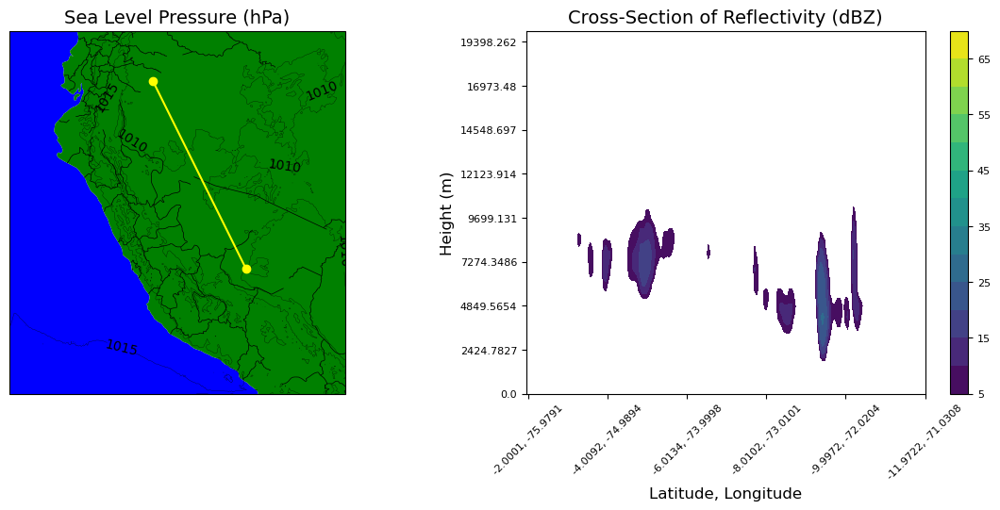

In [255]:
# Define a cross section with latitude and longitude coordinates
cross_start = CoordPair(lat=-2, lon=-76)
cross_end = CoordPair(lat=-12, lon=-71)

# Use multi-file wrfin 'wrf_files' for this example
# Get WRF variables
slp = getvar(wrf_files, "slp", timeidx=-1)
ht = getvar(wrf_files, "z", timeidx=-1)
dbz = getvar(wrf_files, "dbz", timeidx=-1)
Z = 10**(dbz/10.) # Use linear Z for interpolation

# Compute the vertical cross-section interpolation. Include the lat/lon
# points along the cross-section in the metadata by setting latlon to True.
z_cross = vertcross(Z, ht, wrfin=wrf_files, 
                    start_point=cross_start, 
                    end_point=cross_end,
                    latlon=True, meta=True)

# vertcross(field3d, vert, desiredlev)
# field3d: field to be interpolated nx x ny x nz
# vert: vertical coordinate
# wrfin=wrfin: This is used to obtain the map projection when using latitude,longitude coordinates.
# Start/end_point represent the location on the ground, the 'x' coord on a xz-plane
# latlon: Set to True to also interpolate the two-dimensional lat/lon coordinates along the same horizontal line and include this information in the metadata

# Convert back to dBz after interpolation
dbz_cross = 10.0 * np.log10(z_cross)

# Get the lat/lon points
lats, lons = latlon_coords(slp)

# Get the cartopy projection object
cart_proj = get_cartopy(slp)

# Create a figure that will have 2 subplots (1 row, 2 columns)
# Signature: Figure.add_subplot(nrows, ncols, index, **kwargs)
fig = plt.figure(figsize=(15,5))
ax_slp = fig.add_subplot(1,2,1,projection=cart_proj)
ax_dbz = fig.add_subplot(1,2,2)


# Create states, land, and ocean features using Cartopy 

land = NaturalEarthFeature(category='physical', name='land', scale='50m',
                                    facecolor='green')
ocean = NaturalEarthFeature(category='physical', name='ocean', scale='50m',
                                     facecolor='blue')

#these are additional features you can add to geo plots (like boders, rivers, lakes..etc)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none',
    linewidth=1)



# Make the pressure contours
slp_levels = np.arange(990, 1040, 5) #el 1000 agreglo a 1 0 2 si quieres ver slp en contour

slp_contours = ax_slp.contour(to_np(lons),
                              to_np(lats),
                              to_np(slp),
                              levels=slp_levels,
                              linewidths=0.2,
                              colors="black",
                              zorder=3,
                              transform=crs.PlateCarree())

#Add contour labels for pressure
ax_slp.clabel(slp_contours, fmt="%i")

# Draw the cross section line
ax_slp.plot([cross_start.lon, cross_end.lon], # Can do it this way because of how coordpair outputs and from lon=x lat=y
            [cross_start.lat, cross_end.lat], # Similar to how we used [0] and [1] before
            color="yellow", 
            marker="o",  
            zorder=3,
            transform=crs.PlateCarree())

# Draw the oceans, land, and states
ax_slp.add_feature(ocean)
ax_slp.add_feature(land)
ax_slp.add_feature(states_provinces, linewidth=.5, edgecolor="black")


#############
# Make the contour plot for dbz
dbz_levels = np.arange(5.,75.,5.)
dbz_contours = ax_dbz.contourf(to_np(dbz_cross), levels=dbz_levels, 
                               cmap='viridis')
cb_dbz = fig.colorbar(dbz_contours, ax=ax_dbz)
cb_dbz.ax.tick_params(labelsize=8)

# Set the x-ticks to use latitude and longitude labels
coord_pairs = to_np(dbz_cross.coords["xy_loc"])
x_ticks = np.arange(coord_pairs.shape[0])
x_labels = [pair.latlon_str() for pair in to_np(coord_pairs)]


# Only keeping ~5 xticks
thin = [int(x/5.) for x in x_ticks.shape]
ax_dbz.set_xticks(x_ticks[1::thin[0]])
ax_dbz.set_xticklabels(x_labels[::thin[0]], rotation=45, fontsize=8)

# Set the y-ticks to be height
vert_vals = to_np(dbz_cross.coords["vertical"])
v_ticks = np.arange(vert_vals.shape[0])
# Only keeping ~8 vertical ticks
thin = [int(x/8.) for x in v_ticks.shape]
ax_dbz.set_yticks(v_ticks[::thin[0]])
ax_dbz.set_yticklabels(vert_vals[::thin[0]], fontsize=8)

# Set the x-axis and  y-axis labels
ax_dbz.set_xlabel("Latitude, Longitude", fontsize=12)
ax_dbz.set_ylabel("Height (m)", fontsize=12)

# Add a title
ax_slp.set_title("Sea Level Pressure (hPa)", {"fontsize" : 14})
ax_dbz.set_title("Cross-Section of Reflectivity (dBZ)", {"fontsize" : 14})


plt.show()

In [260]:
# Import animation specific Python packages
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Use multi-file variable 'wrf_files' for this example
# Get sea level pressure for all times
slp_all = getvar(wrf_files, "slp", timeidx=ALL_TIMES)
# Use ALL_TIMES to make sure every file and all data is selected from all three wrfout files. 

# Get the cartopy projection object
cart_proj = get_cartopy(slp_all)

# Create figure and ax object
fig = plt.figure(figsize=(10,7.5))
ax_slp = plt.axes(projection=cart_proj)

# Download and create the states, land, and oceans using cartopy features
states = NaturalEarthFeature(category='cultural', scale='50m', facecolor='none',
                                      name='admin_1_states_provinces_shp')
land = NaturalEarthFeature(category='physical', name='land', scale='50m',
                                    facecolor='green')
ocean = NaturalEarthFeature(category='physical', name='ocean', scale='50m',
                                     facecolor='blue')

slp_levels = np.arange(950.,1030.,5.)

num_frames = slp_all.shape[0] 
# Look at shape because we read in all 9 time steps across the three files. Selected [0] to selected for the Time
# dimension in the array 

# This function is called for each frame of the animation, where
# i is the frame index. Here is where the animation frames need 
# to be created.


def animate(i):
    ax_slp.clear()
    slp = slp_all[i,:]
    
    # Get the lat/lon coordinates
    lats, lons = latlon_coords(slp)
    
    ax_slp.add_feature(ocean)
    ax_slp.add_feature(land)
    ax_slp.add_feature(states, linewidth=.5, edgecolor="black")
    
    slp_contours = ax_slp.contour(to_np(lons), 
                                  to_np(lats), 
                                  to_np(slp), 
                                  levels=slp_levels,
                                  colors="black", 
                                  zorder=5,
                                  transform=crs.PlateCarree()) 
    
    # Add contour labels for pressure
    ax_slp.clabel(slp_contours, fmt="%i")
    
    # Set the map bounds
    ax_slp.set_xlim(cartopy_xlim(slp))
    ax_slp.set_ylim(cartopy_ylim(slp))
        
    return ax_slp


# Create the animation by supplying a figure, the animation object, 
# the number of frames and an interval in milliseconds that is the 
# delay between frames.

anim = FuncAnimation(fig, animate, num_frames, interval=500)

# To work with jupyter notebook, you need to use the HTML generated
# by the HTML function in the IPython.display package.
# If you change 'to_jshtml' to be 'to_html5_video', you will get an 
# HTML5 video instead.

#HTML(ani.to_html5_video())
#HTML(ani.to_jshtml())
#HTML(ani.to_html5_video())


RuntimeError: Requested MovieWriter (ffmpeg) not available